# **Thông tin môn học**
Môn học: Học sâu cho Khoa học dữ liệu

Nhóm: 7 - deepstudy

# **Bối cảnh**

Trên Eedi, học sinh trả lời các Câu hỏi Chẩn đoán (Diagnostic Questions - DQ), là câu hỏi trắc nghiệm với bốn phương án: một câu trả lời đúng và ba câu trả lời gây nhiễu (câu trả lời sai). Mỗi câu hỏi gây nhiễu được thiết kế cẩn thận để nắm bắt một quan niệm sai lầm cụ thể `misconception`. Dưới đây là một ví dụ DQ:

![alt text](../.source/example_DQ_1.png "Ví dụ về DQ")

Trong ví dụ này, nếu học sinh chọn câu trả lời gây nhiễu là "13", các em có thể hiểu nhầm là "Carries out operations from left to right regardless of priority order" ("Thực hiện các phép tính từ trái sang phải bất kể thứ tự ưu tiên").

Việc gắn nhãn các yếu tố gây nhiễu với các quan niệm sai lầm `misconception` tương ứng là điều cần thiết nhưng tốn thời gian và khó có thể duy trì tính nhất quán giữa những người dán nhãn. Các quan niệm sai lầm `misconception` khác nhau đáng kể về mức độ chi tiết của mô tả, và các quan niệm sai lầm mới thường được phát hiện bởi người gắn nhãn các yếu tố gây nhiễu trong các lĩnh vực chủ đề mới.

Những nỗ lực ban đầu để sử dụng các mô hình ngôn ngữ được đào tạo trước (pre-trained language models) đã không thành công, có thể là do tính phức tạp của nội dung toán học trong các câu hỏi. Do đó, cần có một cách tiếp cận hiệu quả và nhất quán hơn để hợp lý hóa quy trình gắn thẻ và nâng cao chất lượng tổng thể.

Cuộc thi này thách thức phát triển một **_mô hình Xử lý ngôn ngữ tự nhiên (NLP)_** được điều khiển bởi **_Học máy (ML)_** để dự đoán mối quan hệ giữa các quan niệm sai lầm `misconception` và yếu tố gây nhiễu. Mục tiêu là tạo ra một mô hình không chỉ phù hợp với các quan niệm sai lầm `misconception` đã biết mà còn khái quát hóa thành các quan niệm sai lầm `misconception` mới nổi. Một mô hình như vậy sẽ hỗ trợ người dán nhãn trong việc lựa chọn chính xác các quan niệm sai lầm phù hợp từ cả các tùy chọn hiện có và mới được xác định. Nhiệm vụ này có thể giúp cải thiện sự hiểu biết và quản lý các quan niệm sai lầm, nâng cao trải nghiệm giáo dục cho cả học sinh và giáo viên.

**_Đánh giá mô hình:_ Mean Average Precision @ 25 ($\text{MAP@25}$)**

$$\text{MAP@25}=\frac{1}{U}\sum^{U}_{u=1}{\sum^{\min(n, 25)}_{k=1}{P(k)\times}\text{rel}(k)}$$

Trong đó:
- $U$: Số lượng dự đoán quan niệm sai lầm;
- $P(k)$: Độ chính xác tại điểm $k$;
- $n$: Số dự đoán được gửi cho mỗi dự đoán quan niệm sai lầm;
- $\text{rel}(k)$: Hàm trả về
$\begin{cases}
1 & \quad\text{nếu dự đoán tại vị trí } k \text{ là } \textbf{đúng}\\
0 & \quad\text{nếu dự đoán tại vị trí } k \text{ là } \textbf{sai}
\end{cases}$. Ngay khi $\text{rel}(k)$ trả về $1$ tại vị trí $k$, các dự đoán tiếp theo từ $k+1$ cho đến hết sẽ được bỏ qua trong độ đo.

# **Khai báo thư viện cần thiết**

In [2]:
import numpy as np
import pandas as pd
import polars as pl

import matplotlib.pyplot as plt
# Set dpi for all plots
plt.rcParams['figure.dpi'] = 320
from matplotlib import font_manager
# personal_path = './fonts/'
# # Get all files in personal_path
# font_files = font_manager.findSystemFonts(fontpaths=personal_path)
# for font_file in font_files:
#     font_manager.fontManager.addfont(font_file)
# # Set font
# plt.rcParams['font.family'] = 'Montserrat'
import seaborn as sns

from collections import Counter
from scipy import stats
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from transformers import AutoTokenizer, AutoModel
import torch
import textstat

import nltk
from nltk.util import ngrams
import re
import sentencepiece as spm

import warnings
warnings.filterwarnings("ignore")

nltk.download('stopwords')
stopwords = sorted(nltk.corpus.stopwords.words("english"))
remove_stopwords = ["and", "or", "not", "no", "nor"]
for word in remove_stopwords:
    stopwords.remove(word)
from nltk.stem import WordNetLemmatizer
nltk.download("wordnet")
nltk.download("omw-1.4")
nltk.download('punkt_tab')

# Color palette for A, B, C, D, TRUE, FALSE
COLOR_LIST = ["#FFCFDF", "#FEFDCA", "#E0F9B5", "#B9F3FC", "#9ADCFF", "#EEEEEE"]
DARK_COLOR_LIST = ["#CC0000", "#FF9933", "#99CC00", "#01B3CB", "#0099CC", "#C0C0C0"]

# PATH to save the figures to ./figures/
PATH_FIGURES = "../report/figures/"

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/dagngyen/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/dagngyen/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/dagngyen/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /home/dagngyen/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


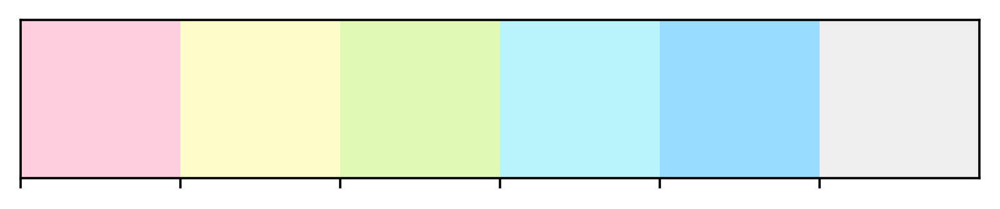

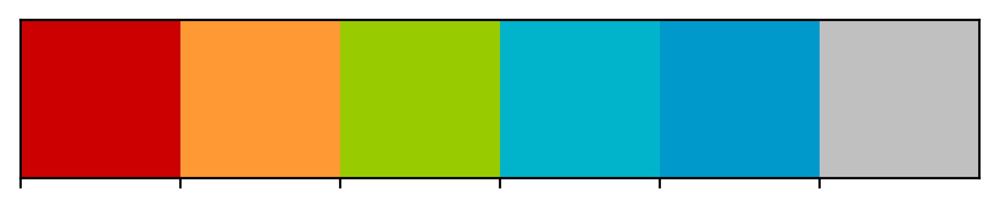

In [3]:
# Show color palette by seaborn
sns.palplot(COLOR_LIST)
sns.palplot(DARK_COLOR_LIST)

# **Tổng quan dữ liệu**

## **_Đọc dữ liệu_**

In [4]:
# Load the data from data folder
train_df = pd.read_csv("../data/train.csv")
test_df = pd.read_csv("../data/test.csv")
misconception_df = pd.read_csv("../data/misconception_mapping.csv")
submission_df = pd.read_csv("../data/sample_submission.csv")

In [5]:
train_df.head()

,QuestionId,ConstructId,ConstructName,SubjectId,SubjectName,CorrectAnswer,QuestionText,AnswerAText,AnswerBText,AnswerCText,AnswerDText,MisconceptionAId,MisconceptionBId,MisconceptionCId,MisconceptionDId
0,0,856,Use the order of operations to carry out calcu...,33,BIDMAS,A,\[\n3 \times 2+4-5\n\]\nWhere do the brackets ...,\( 3 \times(2+4)-5 \),\( 3 \times 2+(4-5) \),\( 3 \times(2+4-5) \),Does not need brackets,NaN,NaN,NaN,1672.0
1,1,1612,Simplify an algebraic fraction by factorising ...,1077,Simplifying Algebraic Fractions,D,"Simplify the following, if possible: \( \frac{...",\( m+1 \),\( m+2 \),\( m-1 \),Does not simplify,2142.0,143.0,2142.0,NaN
2,2,2774,Calculate the range from a list of data,339,Range and Interquartile Range from a List of Data,B,Tom and Katie are discussing the \( 5 \) plant...,Only\nTom,Only\nKatie,Both Tom and Katie,Neither is correct,1287.0,NaN,1287.0,1073.0
3,3,2377,Recall and use the intersecting diagonals prop...,88,Properties of Quadrilaterals,C,The angles highlighted on this rectangle with ...,acute,obtuse,\( 90^{\circ} \),Not enough information,1180.0,1180.0,NaN,1180.0
4,4,3387,Substitute positive integer values into formul...,67,Substitution into Formula,A,The equation \( f=3 r^{2}+3 \) is used to find...,\( 30 \),\( 27 \),\( 51 \),\( 24 \),NaN,NaN,NaN,1818.0


In [6]:
test_df.head()

,QuestionId,ConstructId,ConstructName,SubjectId,SubjectName,CorrectAnswer,QuestionText,AnswerAText,AnswerBText,AnswerCText,AnswerDText
0,1869,856,Use the order of operations to carry out calcu...,33,BIDMAS,A,\[\n3 \times 2+4-5\n\]\nWhere do the brackets ...,\( 3 \times(2+4)-5 \),\( 3 \times 2+(4-5) \),\( 3 \times(2+4-5) \),Does not need brackets
1,1870,1612,Simplify an algebraic fraction by factorising ...,1077,Simplifying Algebraic Fractions,D,"Simplify the following, if possible: \( \frac{...",\( m+1 \),\( m+2 \),\( m-1 \),Does not simplify
2,1871,2774,Calculate the range from a list of data,339,Range and Interquartile Range from a List of Data,B,Tom and Katie are discussing the \( 5 \) plant...,Only\nTom,Only\nKatie,Both Tom and Katie,Neither is correct


In [7]:
misconception_df.head()

,MisconceptionId,MisconceptionName
0,0,Does not know that angles in a triangle sum to...
1,1,Uses dividing fractions method for multiplying...
2,2,Believes there are 100 degrees in a full turn
3,3,Thinks a quadratic without a non variable term...
4,4,Believes addition of terms and powers of terms...


In [8]:
submission_df.head()

,QuestionId_Answer,MisconceptionId
0,1869_B,1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 1...
1,1869_C,1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 1...
2,1869_D,1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 1...
3,1870_A,1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 1...
4,1870_B,1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 1...


## **_Kiểu dữ liệu_**

- Tập dữ liệu `train/test.csv`:

In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1869 entries, 0 to 1868
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   QuestionId        1869 non-null   int64  
 1   ConstructId       1869 non-null   int64  
 2   ConstructName     1869 non-null   object 
 3   SubjectId         1869 non-null   int64  
 4   SubjectName       1869 non-null   object 
 5   CorrectAnswer     1869 non-null   object 
 6   QuestionText      1869 non-null   object 
 7   AnswerAText       1869 non-null   object 
 8   AnswerBText       1869 non-null   object 
 9   AnswerCText       1869 non-null   object 
 10  AnswerDText       1869 non-null   object 
 11  MisconceptionAId  1135 non-null   float64
 12  MisconceptionBId  1118 non-null   float64
 13  MisconceptionCId  1080 non-null   float64
 14  MisconceptionDId  1037 non-null   float64
dtypes: float64(4), int64(3), object(8)
memory usage: 219.2+ KB


_Thông tin cơ bản về dữ liệu `train.csv`_:
- Số lượng mẫu dữ liệu: 1,869; mỗi dòng là dữ liệu ghi chép nội dung và các thông tin liên quan về DQ, các câu trả lời và giải thích quan niệm sai lầm cho các câu trả lời có yếu tố gây nhiễu.
- Số lượng đặc trưng dữ liệu: 15. Cụ thể ý nghĩa của từng đặc trưng như sau:
    + `QuestionId` (`int`): Mã định danh duy nhất cho từng câu hỏi DQ
    + `ConstructId` (`int`): Mã định danh duy nhất cho hướng dẫn cấu trúc thực hiện để trả lời câu hỏi DQ (~ maybe tiền đề câu hỏi cần sẽ làm gì để giải quyết được nội dung câu hỏi)
    + `ConstructName` (`str`): Nội dung hướng dẫn cấu trúc thực hiện để trả lời câu hỏi DQ (~ maybe tiền đề câu hỏi cần sẽ làm gì để giải quyết được nội dung câu hỏi)
    + `SubjectId` (`int`): Mã định danh duy nhất cho môn học liên quan đến câu hỏi
    + `SubjectName` (`str`): Tên môn học liên quan đến câu hỏi
    + `CorrectAnswer` (`str`): Câu trả lời đúng (Chỉ chọn 1 trong: $A$, $B$, $C$ hoặc $D$)
    + `QuestionText` (`str`): Nội dung câu hỏi
    + `Answer[A/B/C/D]Text` (`str`): Nội dung câu trả lời phương án $\left[A/B/C/D\right]$
    + `Misconception[A/B/C/D]Id` (`int`): Mã định danh duy nhất cho quan niệm sai lầm. Nhãn quan niệm sai lầm được gắn sẵn trong `train.csv`; nhiệm vụ của người tham gia là dự đoán các nhãn này cho `test.csv`

In [10]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   QuestionId     3 non-null      int64 
 1   ConstructId    3 non-null      int64 
 2   ConstructName  3 non-null      object
 3   SubjectId      3 non-null      int64 
 4   SubjectName    3 non-null      object
 5   CorrectAnswer  3 non-null      object
 6   QuestionText   3 non-null      object
 7   AnswerAText    3 non-null      object
 8   AnswerBText    3 non-null      object
 9   AnswerCText    3 non-null      object
 10  AnswerDText    3 non-null      object
dtypes: int64(3), object(8)
memory usage: 396.0+ bytes


_Thông tin cơ bản về dữ liệu `test.csv`_:
- Số lượng mẫu dữ liệu: 3; mỗi dòng là dữ liệu ghi chép nội dung và các thông tin liên quan về DQ, các câu trả lời và giải thích quan niệm sai lầm cho các câu trả lời có yếu tố gây nhiễu.
- Số lượng đặc trưng dữ liệu: 11. Cụ thể ý nghĩa của từng đặc trưng như sau:
    + `QuestionId` (`int`): Mã định danh duy nhất cho từng câu hỏi DQ
    + `ConstructId` (`int`): Mã định danh duy nhất cho hướng dẫn cấu trúc thực hiện để trả lời câu hỏi DQ (~ maybe tiền đề câu hỏi cần sẽ làm gì để giải quyết được nội dung câu hỏi)
    + `ConstructName` (`str`): Nội dung hướng dẫn cấu trúc thực hiện để trả lời câu hỏi DQ (~ maybe tiền đề câu hỏi cần sẽ làm gì để giải quyết được nội dung câu hỏi)
    + `SubjectId` (`int`): Mã định danh duy nhất cho môn học liên quan đến câu hỏi
    + `SubjectName` (`str`): Tên môn học liên quan đến câu hỏi
    + `CorrectAnswer` (`str`): Câu trả lời đúng (Chỉ chọn 1 trong: $A$, $B$, $C$ hoặc $D$)
    + `QuestionText` (`str`): Nội dung câu hỏi
    + `Answer[A/B/C/D]Text` (`str`): Nội dung câu trả lời phương án $\left[A/B/C/D\right]$

- Tập dữ liệu `sample_submission.csv`:

In [11]:
submission_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   QuestionId_Answer  9 non-null      object
 1   MisconceptionId    9 non-null      object
dtypes: object(2)
memory usage: 276.0+ bytes


_Đây là một ví dụ tệp nộp theo đúng định dạng:_
- `QuestionId_Answer`: Mỗi câu hỏi có ba câu trả lời không chính xác mà bạn cần dự đoán, có format là `[QuestionID]_[A/B/C/D]`
- `MisconceptionId`: Có thể dự đoán tối đa 25 giá trị, phân cách bằng dấu cách.

- Tập dữ liệu `misconception_mapping.csv`:

In [12]:
misconception_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2587 entries, 0 to 2586
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   MisconceptionId    2587 non-null   int64 
 1   MisconceptionName  2587 non-null   object
dtypes: int64(1), object(1)
memory usage: 40.6+ KB


_Thông tin cơ bản về dữ liệu `misconception_mapping.csv`_:
- Số lượng mẫu dữ liệu: 2587; mỗi dòng là dữ liệu ghi chép nội dung quan niệm sai lầm `misconception`.
- Số lượng đặc trưng dữ liệu: 2. Cụ thể ý nghĩa của từng đặc trưng như sau:
    + `MisconceptionId` (`int`): Mã định danh duy nhất cho quan niệm sai lầm `misconception`
    + `MisconceptionName` (`str`): Nội dung quan niệm sai lầm `misconception`; dùng để map tới `Misconception[A/B/C/D]Id` trong tập dữ liệu `train.csv`

# **Khám phá và tiền xử lý dữ liệu**

Ta sẽ tiến hành khám phá sâu về dữ liệu `train.csv` và `misconception_mapping.csv` để có cái nhìn chung về dữ liệu sẽ dùng để huấn luyện mô hình tự xây dựng.

## **_Tập dữ liệu `train.csv`_**

### _Thống kê tổng quát các đặc trưng_

In [13]:
# Describe the train data for categorical columns
category_columns = train_df.select_dtypes(include=['object']).columns
train_df[category_columns].describe()

,ConstructName,SubjectName,CorrectAnswer,QuestionText,AnswerAText,AnswerBText,AnswerCText,AnswerDText
count,1869,1869,1869,1869,1869,1869,1869,1869
unique,757,163,4,1857,1219,1230,1222,1184
top,Calculate the square of a number,Linear Equations,C,Which of the following pairs of function machi...,Only Tom,Only Katie,Both Tom and Katie,Neither is correct
freq,14,53,488,4,93,109,158,187


In [14]:
# Describe the train data for numerical columns
numeric_columns = train_df.select_dtypes(include=['int64', 'float64']).columns
train_df[numeric_columns].describe()

,QuestionId,ConstructId,SubjectId,MisconceptionAId,MisconceptionBId,MisconceptionCId,MisconceptionDId
count,1869.000000,1869.000000,1869.000000,1135.000000,1118.000000,1080.000000,1037.000000
mean,934.000000,1613.261637,225.370787,1308.599119,1308.029517,1285.300926,1264.568949
std,539.678145,1060.591804,238.536233,744.518370,766.487351,742.212198,759.818341
min,0.000000,4.000000,33.000000,1.000000,1.000000,2.000000,0.000000
25%,467.000000,575.000000,92.000000,686.000000,628.500000,652.250000,578.000000
50%,934.000000,1470.000000,203.000000,1336.000000,1379.000000,1294.500000,1282.000000
75%,1401.000000,2637.000000,238.000000,1954.000000,1970.000000,1912.000000,1897.000000
max,1868.000000,3526.000000,1984.000000,2585.000000,2586.000000,2585.000000,2583.000000


- Dataframe `preprocessed_train` sẽ là tập dữ liệu đã được tiền xử lý của `train_df`.
- Dataframe `eda_train` sẽ dùng để tập trung vào những dữ liệu chính để khám phá.

In [15]:
preprocessed_train = train_df.copy()

### _Khám phá `Misconception[A/B/C/D]Id`, `CorrectAnswer`, `SubjectName` và `ConstructName`_

#### Khám phá `CorrectAnswer`

In [16]:
eda_train = preprocessed_train[["CorrectAnswer"]].copy()

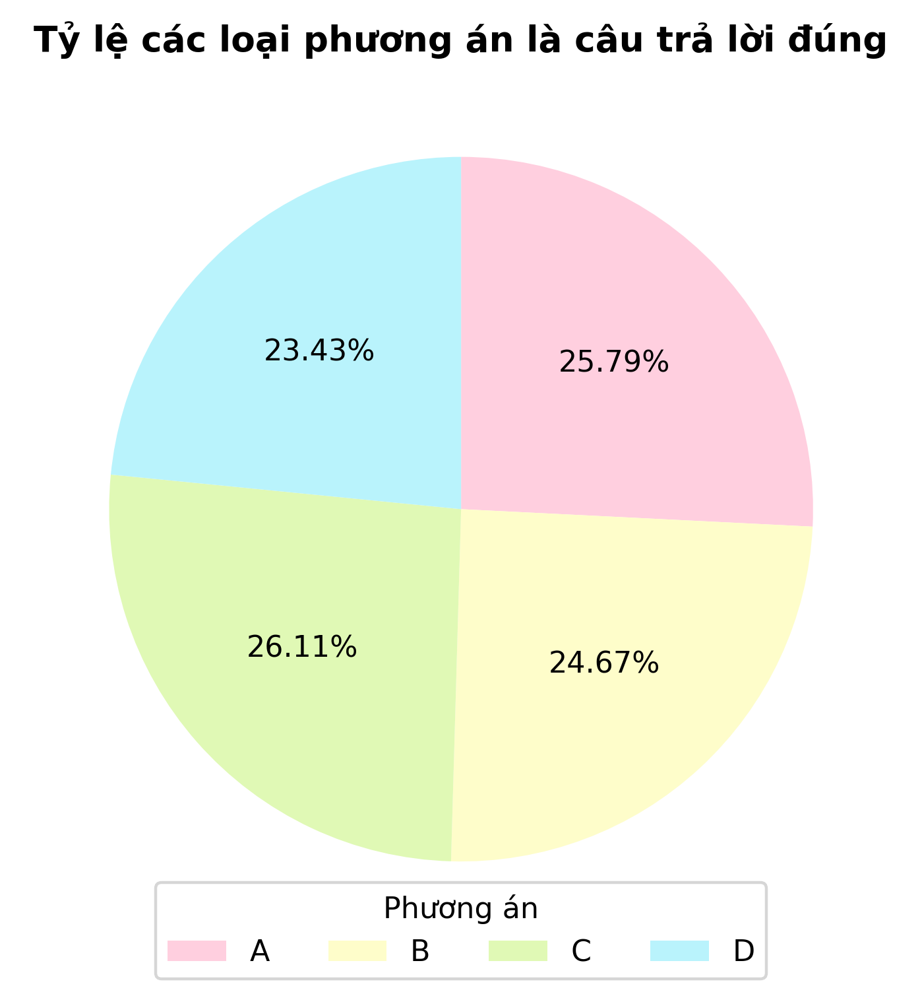

In [17]:
# Calculate the percentage of correct answers for each A, B, C, D
count_correct_A = eda_train[eda_train.CorrectAnswer == "A"].shape[0]
count_correct_B = eda_train[eda_train.CorrectAnswer == "B"].shape[0]
count_correct_C = eda_train[eda_train.CorrectAnswer == "C"].shape[0]
count_correct_D = eda_train[eda_train.CorrectAnswer == "D"].shape[0]

# Plot pie chart for correct answers
plt.figure(figsize=(4.5, 4.5));
plt.pie([count_correct_A, count_correct_B, count_correct_C, count_correct_D],
        startangle=90, counterclock=False,
        autopct="%.2f%%", colors=COLOR_LIST[:4]);
plt.title("Tỷ lệ các loại phương án là câu trả lời đúng", weight="bold");
plt.legend(labels=["A", "B", "C", "D"] , ncols=4, title="Phương án",
           loc="lower center", bbox_to_anchor=(0.5, -0.05));
plt.tight_layout(pad=0);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "correct_answer_ratio.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Câu trả lời đúng của mỗi câu hỏi phân bố khá đồng đều cho các phương án A, B, C và D;
- Tỷ lệ mỗi câu hỏi có phương án lựa chọn A, B, C và D là đáp án đúng xấp xỉ $\displaystyle\frac{1}{4}$
- Giá trị tỷ lệ của mỗi phương án lựa chọn nằm trong $\left[23,27\right]$.

#### Khám phá `Misconception[A/B/C/D]Id`

In [18]:
eda_train = preprocessed_train[["CorrectAnswer", "MisconceptionAId", "MisconceptionBId", "MisconceptionCId", "MisconceptionDId"]].copy()

##### Khám phá dữ liệu bị thiếu

- **_Dữ liệu bị thiếu của `Misconception[A/B/C/D]Id`:_** </br>
Ta thấy tồn tại các đặc trưng `Misconception[A/B/C/D]Id` có kiểu dữ liệu `float` thay vì `int` bởi vì có một số điểm dữ liệu bị thiếu `MisconceptionId` do có thể là câu trả lời đúng hoặc câu trả lời gây nhiễu bị thiếu `misconception`:

In [19]:
missing_misconceptionsA = eda_train.MisconceptionAId.isna().sum()
missing_misconceptionsB = eda_train.MisconceptionBId.isna().sum()
missing_misconceptionsC = eda_train.MisconceptionCId.isna().sum()
missing_misconceptionsD = eda_train.MisconceptionDId.isna().sum()

missing_misconceptions = missing_misconceptionsA + missing_misconceptionsB + missing_misconceptionsC + missing_misconceptionsD
count_correct = count_correct_A + count_correct_B + count_correct_C + count_correct_D

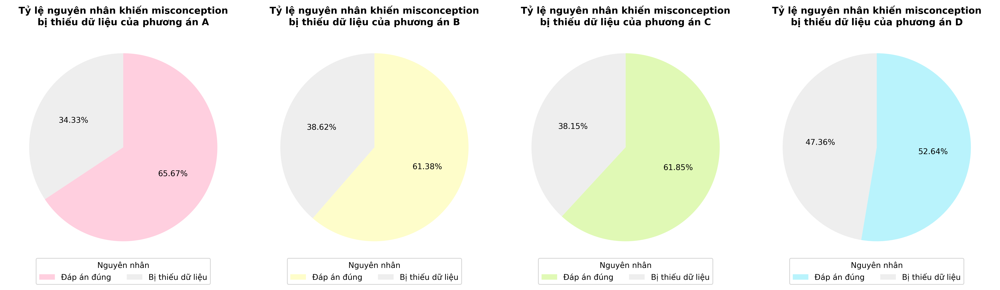

In [20]:
# Create grid subplots
fig, axs = plt.subplots(1, 4, figsize=(18, 10), dpi=320);

# Plot the number of missing misconceptions
axs[0].pie([count_correct_A, missing_misconceptionsA-count_correct_A],
              startangle=90, counterclock=False, autopct='%.2f%%',
              colors=[COLOR_LIST[0], COLOR_LIST[-1]]);
axs[0].set_title("Tỷ lệ nguyên nhân khiến misconception\nbị thiếu dữ liệu của phương án A", fontdict={"weight": "bold"});
axs[0].legend(labels=["Đáp án đúng", "Bị thiếu dữ liệu"], title="Nguyên nhân",
             ncols=2, loc="lower center", bbox_to_anchor=(0.5, -0.1));

axs[1].pie([count_correct_B, missing_misconceptionsB-count_correct_B],
              startangle=90, counterclock=False, autopct='%.2f%%',
              colors=[COLOR_LIST[1], COLOR_LIST[-1]]);
axs[1].set_title("Tỷ lệ nguyên nhân khiến misconception\nbị thiếu dữ liệu của phương án B", fontdict={"weight": "bold"});
axs[1].legend(labels=["Đáp án đúng", "Bị thiếu dữ liệu"], title="Nguyên nhân",
             ncols=2, loc="lower center", bbox_to_anchor=(0.5, -0.1));

axs[2].pie([count_correct_C, missing_misconceptionsC-count_correct_C],
              startangle=90, counterclock=False, autopct='%.2f%%',
              colors=[COLOR_LIST[2], COLOR_LIST[-1]]);
axs[2].set_title("Tỷ lệ nguyên nhân khiến misconception\nbị thiếu dữ liệu của phương án C", fontdict={"weight": "bold"});
axs[2].legend(labels=["Đáp án đúng", "Bị thiếu dữ liệu"], title="Nguyên nhân",
             ncols=2, loc="lower center", bbox_to_anchor=(0.5, -0.1));

axs[3].pie([count_correct_D, missing_misconceptionsD-count_correct_D],
              startangle=90, counterclock=False, autopct='%.2f%%',
              colors=[COLOR_LIST[3], COLOR_LIST[-1]]);
axs[3].set_title("Tỷ lệ nguyên nhân khiến misconception\nbị thiếu dữ liệu của phương án D", fontdict={"weight": "bold"});
axs[3].legend(labels=["Đáp án đúng", "Bị thiếu dữ liệu"], title="Nguyên nhân",
             ncols=2, loc="lower center", bbox_to_anchor=(0.5, -0.1));

plt.tight_layout(w_pad=1.5);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "missing_misconceptions_each_answer.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Từ 50% đến 70% dữ liệu là phương án trả lời thuộc đáp án đúng của câu hỏi, do đó không thể có misconception;
- Từ 30% đến 50% dữ liệu thực sự bị khuyết dự đoán misconception, đây là một tỷ lệ
đáng quan ngại ảnh hưởng đến hiệu suất dự đoán của mô hình sau này

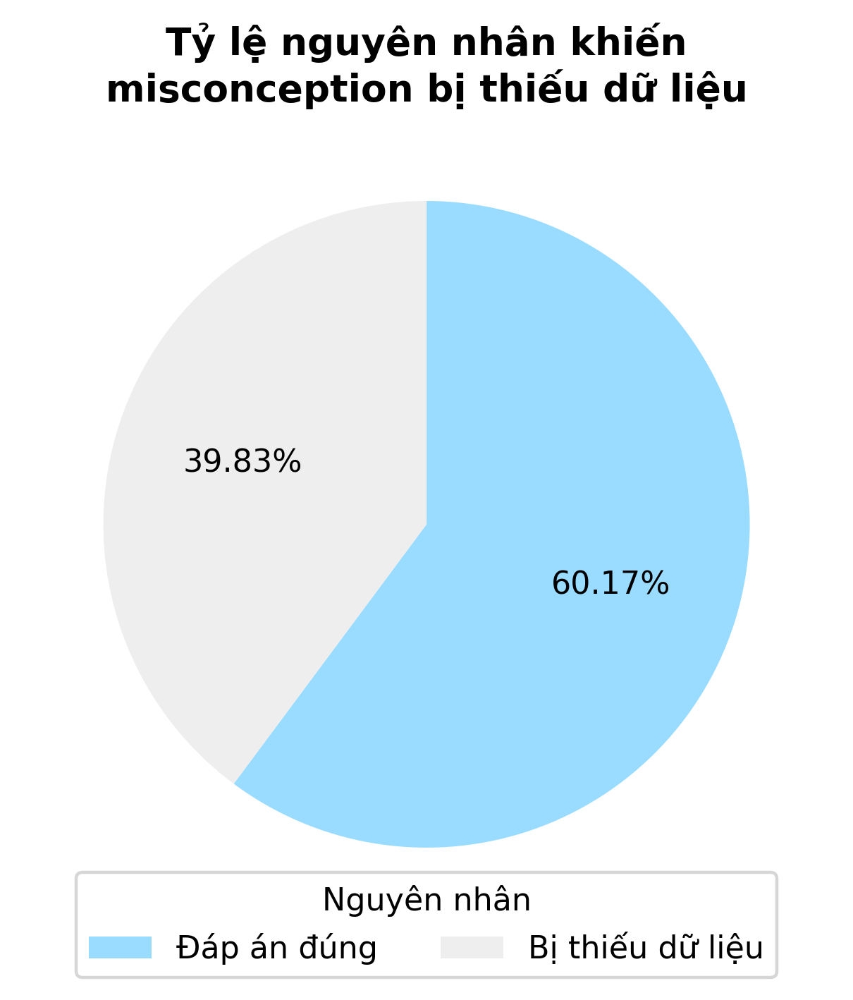

In [21]:
plt.figure(figsize=(4.5, 4.5), dpi=320)

plt.pie([count_correct, missing_misconceptions-count_correct],
          startangle=90, counterclock=False, autopct='%.2f%%',
          colors=[COLOR_LIST[-2], COLOR_LIST[-1]]);
plt.title("Tỷ lệ nguyên nhân khiến\nmisconception bị thiếu dữ liệu", fontdict={"weight": "bold"});
plt.legend(labels=["Đáp án đúng", "Bị thiếu dữ liệu"], title="Nguyên nhân",
             ncols=2, loc="lower center", bbox_to_anchor=(0.5, -0.08));

plt.tight_layout(pad=1);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "missing_misconceptions.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Ta thấy đa số `misconception` bị thiếu là do phương án đúng, không cần giải thích về quan niệm sai lầm, chiếm khoảng gần $\displaystyle\frac{2}{3}$ trong tổng số `misconception` bị thiếu. Tuy nhiên, còn tồn tại hơn $\displaystyle\frac{1}{3}$ trong tổng số `misconception` bị thiếu là thực sự do missing data, nó ảnh hưởng đến hiệu suất huấn luyện mô hình. Nếu không có phương pháp đề xuất fill giá trị bị thiếu một cách phù hợp, điểm đánh giá mô hình khó để vượt qua $0.6$.

Và từ phần này trở đi, ta coi như missing value của `Misconception[A/B/C/D]Id` không bao gồm lý do `CorrectAnswer`.

- **_Số lượng missing value `Misconception[A/B/C/D]Id` theo từng câu hỏi:_**</br>
Phần này, thực hiện thống kê số lượng đáp án sai bị missing value. Số lượng missing value là giá trị nguyên trong đoạn $[0,3]$.

In [22]:
eda_train.loc[eda_train.CorrectAnswer == "A", "MisconceptionAId"] = eda_train.loc[eda_train.CorrectAnswer == "A", "MisconceptionAId"].fillna(-1)
eda_train.loc[eda_train.CorrectAnswer == "B", "MisconceptionBId"] = eda_train.loc[eda_train.CorrectAnswer == "B", "MisconceptionBId"].fillna(-1)
eda_train.loc[eda_train.CorrectAnswer == "C", "MisconceptionCId"] = eda_train.loc[eda_train.CorrectAnswer == "C", "MisconceptionCId"].fillna(-1)
eda_train.loc[eda_train.CorrectAnswer == "D", "MisconceptionDId"] = eda_train.loc[eda_train.CorrectAnswer == "D", "MisconceptionDId"].fillna(-1)
# Create a new column to store number missing values of Misconception[A/B/C/D]Id by each row
eda_train["NumberMissing"] = eda_train[["MisconceptionAId", "MisconceptionBId", "MisconceptionCId", "MisconceptionDId"]].isna().sum(axis=1).astype(int)

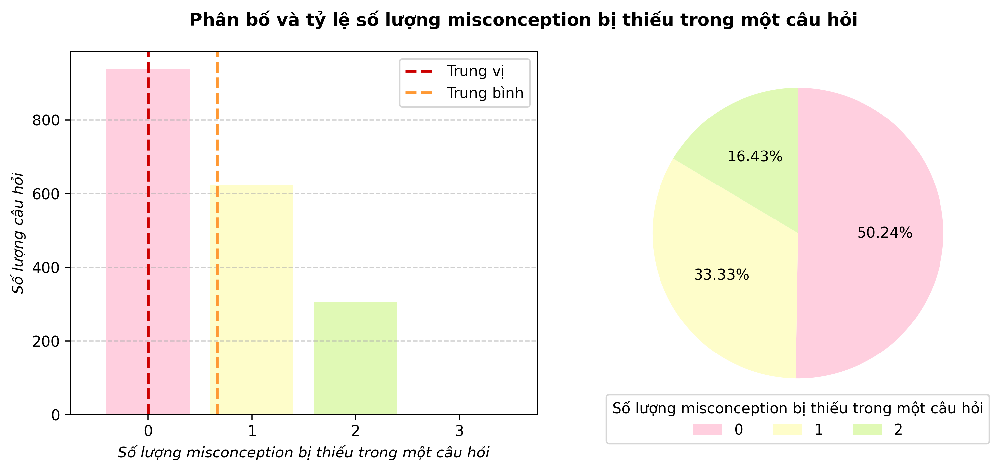

In [23]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4.5), dpi=320);
fig.suptitle("Phân bố và tỷ lệ số lượng misconception bị thiếu trong một câu hỏi", weight="bold");

axs[0].bar(eda_train.NumberMissing.value_counts().index, eda_train.NumberMissing.value_counts().values, color=COLOR_LIST[:4]);
axs[0].set_xlabel("Số lượng misconception bị thiếu trong một câu hỏi", fontdict={'style':'italic'});
axs[0].set_ylabel("Số lượng câu hỏi", fontdict={'style':'italic'});
axs[0].set_xticks(np.arange(5));
axs[0].set_xlim(-0.75, 3.75);
axs[0].grid(axis="y", linestyle="--", alpha=0.6);
# Plot xline for mean and median for axs[0]
axs[0].axvline(np.percentile(eda_train.NumberMissing, 50), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị")
axs[0].axvline(np.mean(eda_train.NumberMissing), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình")
axs[0].legend();

# Plot pie chart for the percentage of missing misconceptions
axs[1].pie(eda_train.NumberMissing.value_counts().sort_index(),
           startangle=90, counterclock=False, autopct='%.2f%%',
           colors=COLOR_LIST[:4]);
axs[1].legend(labels=["0", "1", "2", "3"], title="Số lượng misconception bị thiếu trong một câu hỏi", ncols=4,
              loc="lower center", bbox_to_anchor=(0.5, -0.1));

fig.tight_layout(w_pad=1.5);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "missing_misconceptions_each_question.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét_:
- Số lượng đáp án sai bị thiếu \texttt{misconception} trong một câu hỏi có giá trị tối đa là 2, nghĩa là không tồn tại bất kỳ câu hỏi nào bị thiếu toàn bộ \texttt{misconception};
- Tỷ lệ câu hỏi có đầy đủ \texttt{misconception} chiếm khoảng 50\% số lượng câu hỏi, tỷ lệ còn lại lần lượt mô tả cho số lượng câu hỏi mà trong đó có ít nhất 1 \texttt{misconception}. Đồng thời, giá trị trung vị cũng có giá trị là $0$, cho thấy đa số câu hỏi mà phương án trả lời sai của nó vẫn được giải thích quan niệm sai lầm;
- Việc xem xét xóa bỏ giá trị thiếu theo đơn vị câu hỏi gây ra hao hụt dữ liệu cao hơn việc loại bỏ giá trị thiếu theo đơn vị \texttt{MisconceptionId}, bởi vì nếu tồn tại câu hỏi chứa nhiều nhất 2 phương án trả lời sai không được gán \texttt{misconception} sẽ vô tình loại bỏ thông tin đã được gán nhãn cho phương án sai còn lại.

##### Quan sát những phân bố các loại `MisconceptionId` ở từng phương án trả lời

In [24]:
answer_A = eda_train.MisconceptionAId[eda_train.MisconceptionAId > -1].value_counts().sort_index().reset_index().astype(int)
answer_B = eda_train.MisconceptionBId[eda_train.MisconceptionBId > -1].value_counts().sort_index().reset_index().astype(int)
answer_C = eda_train.MisconceptionCId[eda_train.MisconceptionCId > -1].value_counts().sort_index().reset_index().astype(int)
answer_D = eda_train.MisconceptionDId[eda_train.MisconceptionDId > -1].value_counts().sort_index().reset_index().astype(int)

answer_A.columns = ["MisconceptionId", "Count"]
answer_B.columns = ["MisconceptionId", "Count"]
answer_C.columns = ["MisconceptionId", "Count"]
answer_D.columns = ["MisconceptionId", "Count"]

answer_A = pd.merge(answer_A, misconception_df.MisconceptionId, how="right", on="MisconceptionId").fillna(0)
answer_B = pd.merge(answer_B, misconception_df.MisconceptionId, how="right", on="MisconceptionId").fillna(0)
answer_C = pd.merge(answer_C, misconception_df.MisconceptionId, how="right", on="MisconceptionId").fillna(0)
answer_D = pd.merge(answer_D, misconception_df.MisconceptionId, how="right", on="MisconceptionId").fillna(0)

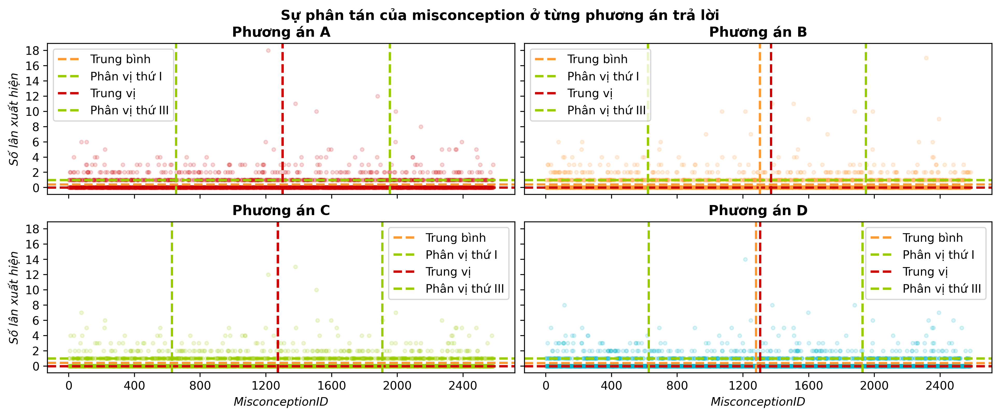

In [25]:
# Plot scatter plot for answer A, B, C, D
fig, axs = plt.subplots(2, 2, figsize=(12, 5), dpi=320, sharex=True, sharey=True);
fig.suptitle("Sự phân tán của misconception ở từng phương án trả lời", weight="bold");

axs[0, 0].axhline(answer_A.Count.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
axs[0, 0].axhline(answer_A.Count.quantile(0.25), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axs[0, 0].axhline(answer_A.Count.median(), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axs[0, 0].axhline(answer_A.Count.quantile(0.75), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axs[0, 0].axvline(answer_A[answer_A.Count > 0].MisconceptionId.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
axs[0, 0].axvline(answer_A[answer_A.Count > 0].MisconceptionId.quantile(0.25), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axs[0, 0].axvline(answer_A[answer_A.Count > 0].MisconceptionId.median(), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axs[0, 0].axvline(answer_A[answer_A.Count > 0].MisconceptionId.quantile(0.75), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axs[0, 0].scatter(answer_A.MisconceptionId, answer_A.Count, color=DARK_COLOR_LIST[0], alpha=0.15, s=10);
axs[0, 0].set_title("Phương án A", fontdict={"weight": "bold"});
axs[0, 0].set_xticks(np.arange(0, 2800, 400));
axs[0, 0].set_yticks(np.arange(0, 20, 2));
axs[0, 0].set_ylabel("Số lân xuất hiện", fontdict={"style": "italic"});
axs[0, 0].legend(["Trung bình", "Phân vị thứ I", "Trung vị", "Phân vị thứ III"]);

axs[0, 1].axhline(answer_B.Count.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
axs[0, 1].axhline(answer_B.Count.quantile(0.25), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axs[0, 1].axhline(answer_B.Count.median(), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axs[0, 1].axhline(answer_B.Count.quantile(0.75), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axs[0, 1].axvline(answer_B[answer_B.Count > 0].MisconceptionId.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
axs[0, 1].axvline(answer_B[answer_B.Count > 0].MisconceptionId.quantile(0.25), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axs[0, 1].axvline(answer_B[answer_B.Count > 0].MisconceptionId.median(), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axs[0, 1].axvline(answer_B[answer_B.Count > 0].MisconceptionId.quantile(0.75), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axs[0, 1].scatter(answer_B.MisconceptionId, answer_B.Count, color=DARK_COLOR_LIST[1], alpha=0.15, s=10);
axs[0, 1].set_title("Phương án B", fontdict={"weight": "bold"});
axs[0, 1].legend(["Trung bình", "Phân vị thứ I", "Trung vị", "Phân vị thứ III"]);

axs[1, 0].axhline(answer_C.Count.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
axs[1, 0].axhline(answer_C.Count.quantile(0.25), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axs[1, 0].axhline(answer_C.Count.median(), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axs[1, 0].axhline(answer_C.Count.quantile(0.75), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axs[1, 0].axvline(answer_C[answer_C.Count > 0].MisconceptionId.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
axs[1, 0].axvline(answer_C[answer_C.Count > 0].MisconceptionId.quantile(0.25), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axs[1, 0].axvline(answer_C[answer_C.Count > 0].MisconceptionId.median(), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axs[1, 0].axvline(answer_C[answer_C.Count > 0].MisconceptionId.quantile(0.75), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axs[1, 0].scatter(answer_C.MisconceptionId, answer_C.Count, color=DARK_COLOR_LIST[2], alpha=0.15, s=10);
axs[1, 0].set_title("Phương án C", fontdict={"weight": "bold"});
axs[1, 0].set_xlabel("MisconceptionID", fontdict={"style": "italic"});
axs[1, 0].set_ylabel("Số lân xuất hiện", fontdict={"style": "italic"});
axs[1, 0].legend(["Trung bình", "Phân vị thứ I", "Trung vị", "Phân vị thứ III"]);

axs[1, 1].axhline(answer_D.Count.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
axs[1, 1].axhline(answer_D.Count.quantile(0.25), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axs[1, 1].axhline(answer_D.Count.median(), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axs[1, 1].axhline(answer_D.Count.quantile(0.75), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axs[1, 1].axvline(answer_D[answer_D.Count > 0].MisconceptionId.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
axs[1, 1].axvline(answer_D[answer_D.Count > 0].MisconceptionId.quantile(0.25), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axs[1, 1].axvline(answer_D[answer_D.Count > 0].MisconceptionId.median(), color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axs[1, 1].axvline(answer_D[answer_D.Count > 0].MisconceptionId.quantile(0.75), color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axs[1, 1].scatter(answer_D.MisconceptionId, answer_D.Count, color=DARK_COLOR_LIST[3], alpha=0.15, s=10);
axs[1, 1].set_title("Phương án D", fontdict={"weight": "bold"});
axs[1, 1].set_xlabel("MisconceptionID", fontdict={"style": "italic"});
axs[1, 1].legend(["Trung bình", "Phân vị thứ I", "Trung vị", "Phân vị thứ III"]);

fig.tight_layout(pad=0.5);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "scatter_mcct_each_answer_question.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Giữa các phương án trả lời, phân bố $\texttt{misconception}$ ở hai phương diện loại $\texttt{misconception}$ và số lần xuất hiện của $\texttt{misconception}$ hầu như giống nhau;
- Ở mỗi phương án, hầu hết số lần xuất hiện của \texttt{misconception} là 0 hoặc 1 lần, lý do gây ra điều này là bởi số lượng loại $\texttt{misconception}$ được sử dụng ít hơn so với số lượng mẫu dữ liệu, cộng hưởng với việc tồn tại những loại $\texttt{misconception}$ có số lần xuất hiện lớn hơn nhiều so với trung vị;
- Vì vậy, có thể tổng hợp $\texttt{Misconception[A/B/C/D]Id}$ thành $\texttt{MisconceptionId}$ duy nhất sẽ giúp cải thiện việc xử lý và trực quan đỡ vất vả mà không ảnh hưởng mất mát thông tin.


##### Xây dựng hàm tổng hợp `Misconception[A/B/C/D]Id` thành `MisconceptionId` duy nhất

In [26]:
def synthesizeMisconceptionId(df:pd.DataFrame, min_misconceptionId:int=-1):
    synthesis_df = df.copy()
    synthesis_df.QuestionId = synthesis_df.QuestionId.astype(int)
    
    synthesis_df.loc[synthesis_df.CorrectAnswer == "A", "MisconceptionAId"] = synthesis_df.loc[synthesis_df.CorrectAnswer == "A", "MisconceptionAId"].fillna(min_misconceptionId)
    synthesis_df.loc[synthesis_df.CorrectAnswer == "B", "MisconceptionBId"] = synthesis_df.loc[synthesis_df.CorrectAnswer == "B", "MisconceptionBId"].fillna(min_misconceptionId)
    synthesis_df.loc[synthesis_df.CorrectAnswer == "C", "MisconceptionCId"] = synthesis_df.loc[synthesis_df.CorrectAnswer == "C", "MisconceptionCId"].fillna(min_misconceptionId)
    synthesis_df.loc[synthesis_df.CorrectAnswer == "D", "MisconceptionDId"] = synthesis_df.loc[synthesis_df.CorrectAnswer == "D", "MisconceptionDId"].fillna(min_misconceptionId)
    
    synthesis_df = pd.melt(synthesis_df, synthesis_df.columns[:-4],
                    ["MisconceptionAId", "MisconceptionBId", "MisconceptionCId", "MisconceptionDId"],
                    var_name="MisconceptionId", value_name="MisconceptionIdValue")
    synthesis_df = synthesis_df.sort_values(["QuestionId", "MisconceptionId"], ascending=[True, True])
    synthesis_df["QuestionId"] = synthesis_df["QuestionId"].astype(str) + "_" + synthesis_df["MisconceptionId"].str[-3]
    synthesis_df.drop(columns=["MisconceptionId"], inplace=True)
    synthesis_df.rename(columns={"MisconceptionIdValue": "MisconceptionId"}, inplace=True)
    
    return synthesis_df[synthesis_df.MisconceptionId != -1]

def dropMissingMisconception(df:pd.DataFrame):
    df = df.dropna(subset=["MisconceptionId"])
    df.MisconceptionId = df.MisconceptionId.astype(int)
    return df

In [27]:
preprocessed_train = synthesizeMisconceptionId(preprocessed_train)
preprocessed_train = dropMissingMisconception(preprocessed_train)

In [28]:
preprocessed_train.sample()

,QuestionId,ConstructId,ConstructName,SubjectId,SubjectName,CorrectAnswer,QuestionText,AnswerAText,AnswerBText,AnswerCText,AnswerDText,MisconceptionId
3499,1630_B,207,Round integers to the nearest 100,213,"Rounding to the Nearest Whole (10, 100, etc)",D,"What is \( 356,958 \) rounded to the nearest \...","\( 356,900 \)","\( 356,960 \)","\( 400,000 \)","\( 357,000 \)",1248


##### Khám phá phân bố các loại `MisconceptionId`

In [29]:
count_misconceptions = preprocessed_train.MisconceptionId.astype(str).value_counts().sort_values(ascending=True)

Số lượng misconception trong dữ liệu huấn luyện: 1604


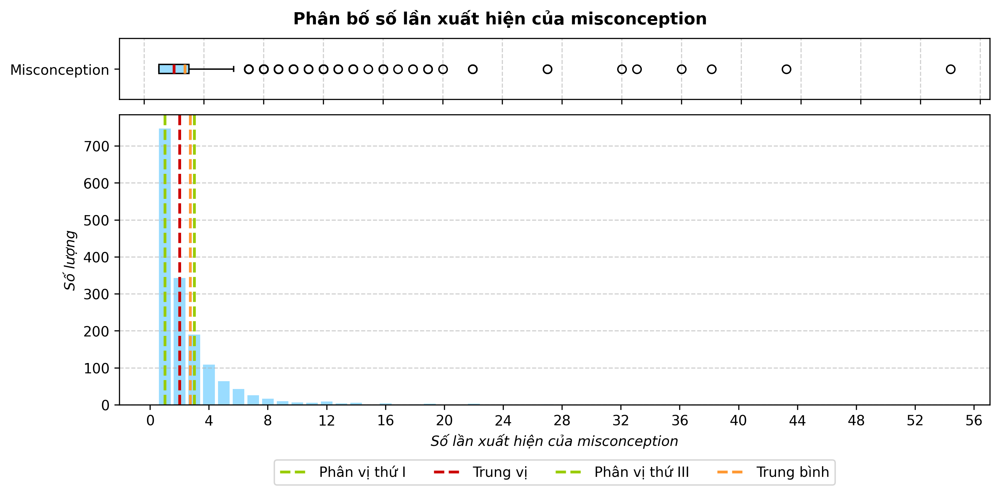

In [30]:
fig, axs = plt.subplots(5, 1, figsize=(10, 5), dpi=320, sharex=True);
fig.suptitle("Phân bố số lần xuất hiện của misconception", weight="bold");

axbig = fig.add_subplot(axs[1].get_gridspec()[1:])
for ax in axs[1:]:
    ax.remove()

axs[0].boxplot(count_misconceptions.values, tick_labels=["Misconception"], vert=False, patch_artist=True,
            boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
            whiskerprops=dict(color="black"), capprops=dict(color="black"),
            medianprops=dict(linestyle='solid', linewidth=2, color=DARK_COLOR_LIST[0]),
            meanprops=dict(linestyle='solid', linewidth=2, color=DARK_COLOR_LIST[1]));
axs[0].grid(axis="x", linestyle="--", alpha=0.6);
modify_ticks = 4
axs[0].set_xticks(np.arange(0, max(count_misconceptions.values) + modify_ticks, modify_ticks));

freq_count = count_misconceptions.value_counts().sort_index()
axbig.bar(freq_count.index, freq_count.values, width=.8, color=COLOR_LIST[-2]);
axbig.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbig.grid(axis="y", linestyle="--", alpha=0.6);
axbig.set_xlabel("Số lần xuất hiện của misconception", fontdict={'style':'italic'});
axbig.set_xticks(np.arange(0, max(count_misconceptions.values) + modify_ticks, modify_ticks));
q1, q2, q3 = np.percentile(count_misconceptions.values, [25, 50, 75])
axbig.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I")
axbig.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị")
axbig.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III")
axbig.axvline(count_misconceptions.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình")
plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=4);

fig.tight_layout(pad=0.75)
print(f"Số lượng misconception trong dữ liệu huấn luyện: {count_misconceptions.shape[0]}")

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "freq_count_misconception.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Chỉ có $1,604$ loại \texttt{misconception} trong tổng số $2,587$ loại là xuất hiện trong dữ liệu huấn luyện, chiếm tỷ lệ khoảng $62\%$. Cho thấy rằng các loại \texttt{misconception} trong dữ liệu huấn luyện chưa thực sự phong phú để mô hình xây dựng đạt được hiệu suất cao;
- Phân bố số lần xuất hiện của \texttt{misconception} hầu hết có giá trị trong $[1,3]$, tồn tại lượng khá nhỏ \texttt{misconception} có số lần xuất hiện lớn hơn $7$ có tần suất thấp hơn đáng kể khiến không thể quan sát rõ bằng mắt thường trong biểu đồ histogram;
- Phân bố có thiên hướng lệch dương mạnh;
- Phân bố số lần xuất hiện của \texttt{misconception} và mối quan hệ giữa chúng có xu hướng tạo thành mạng scale-free với phân phối bậc tuân theo quy luật lũy thừa (power-law).

Slope: -1.9828338233337477
Intercept: 6.888859651005454
R-squared: 0.9187549215720946
P-value: 1.0831253499517404e-15
Standard error: 0.11563740479438639


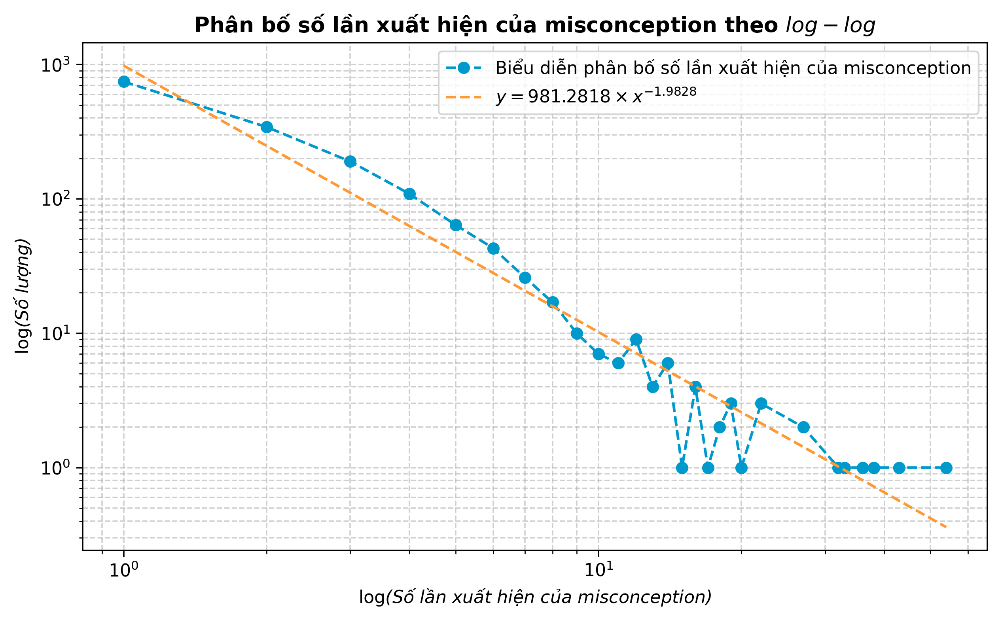

In [31]:
# Predict parameters for the linear regression model to fit the log-log scale
log_freq_count = np.log(freq_count.values)
log_count_misconceptions = np.log(freq_count.index)
# slope, intercept = np.polyfit(log_count_misconceptions, log_freq_count, 1)
slope, intercept, r_value, p_value, std_err = stats.linregress(log_count_misconceptions, log_freq_count)
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")

# Plot the linear regression line with slope and intercept
plt.figure(figsize=(8, 5), dpi=320);
plt.plot(freq_count.index, freq_count.values, marker="o", color=DARK_COLOR_LIST[-2], linestyle="--");
plt.plot(freq_count.index, np.exp(intercept) * freq_count.index**slope, color=DARK_COLOR_LIST[1], linestyle="--");
plt.yscale("log")
plt.xscale("log")
plt.grid(which="both", linestyle="--", alpha=0.6)
plt.xlabel("$\\text{log}$(Số lần xuất hiện của misconception)", fontdict={'style':'italic'});
plt.ylabel("$\\text{log}$(Số lượng)", fontdict={'style':'italic'});
plt.title("Phân bố số lần xuất hiện của misconception theo $log-log$", fontdict={'weight':'bold'});
plt.legend(["Biểu diễn phân bố số lần xuất hiện của misconception", f"$y={np.exp(intercept):.4f}\\times x^{{-1.9828}}$"], loc="upper right");
plt.tight_layout();

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "freq_count_misconception_log_log.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Kết quả cho thấy phân bố tuân theo phân phối bậc tuân theo quy luật lũy thừa của luật mũ xấp xỉ $1.98$ với mức độ phù hợp $91.88\%$ có độ tin cậy $99.99\%$;
- Kết quả này cho ta thấy một cách giải thích khoa học cho việc hầu hết số lần xuất hiện của $\texttt{misconception}$ là 2 lần nhưng lại tồn tại một số \texttt{misconception} có số lần xuất hiện lớn hơn rất nhiều.

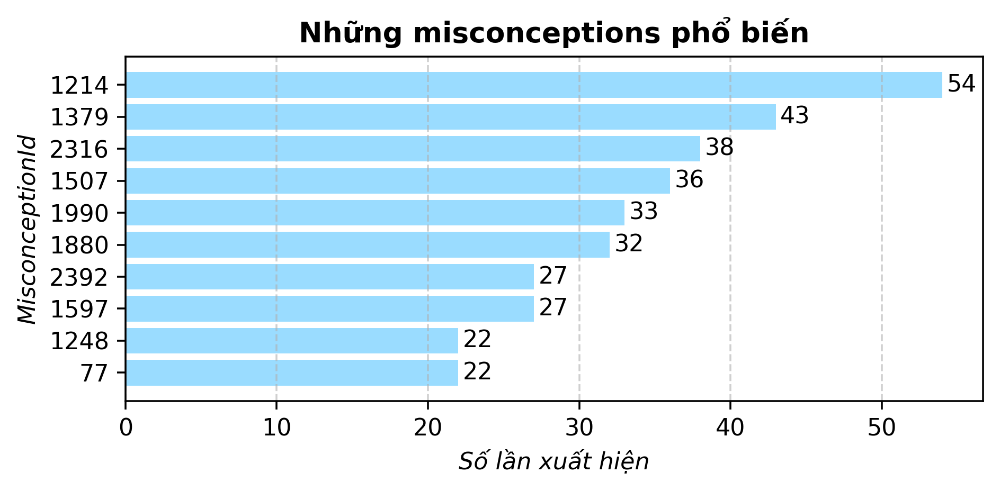

In [31]:
N_TOP = 10

fig = plt.figure(figsize=(6, 3), dpi=320);
plt.title("Những misconceptions phổ biến", weight="bold");

plt.barh(count_misconceptions.tail(N_TOP).index, count_misconceptions.tail(N_TOP).values, color=COLOR_LIST[-2]);
plt.xlabel("Số lần xuất hiện", fontdict={'style':'italic'});
plt.ylabel("MisconceptionId", fontdict={'style':'italic'});
plt.grid(axis="x", linestyle="--", alpha=0.6);
plt.tight_layout(h_pad=0);

for i, v in enumerate(count_misconceptions.tail(N_TOP).values):
    plt.text(v+.3, i, str(v), ha='left', va='center');
    
# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_misconception.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

In [32]:
# Show name of MisconceptionId by mapping with misconception_df
name_popular_misconcepttion = pd.DataFrame(count_misconceptions.tail(N_TOP).index.astype(int), columns=["MisconceptionId"])[-1::-1].reset_index(drop=True)
name_popular_misconcepttion = name_popular_misconcepttion.merge(misconception_df, 'left', ["MisconceptionId"])

print(name_popular_misconcepttion.MisconceptionName.values)

['When solving an equation, uses the same operation rather than the inverse.'
 'Rounds down instead of up'
 'Mixes up squaring and multiplying by 2 or doubling'
 'Carries out operations from left to right regardless of priority order'
 'Fails to reflect across mirror line'
 'Mixes up greater than and less than symbols'
 'Rounds to the wrong degree of accuracy (rounds too much)'
 'Believes multiplying two negatives gives a negative answer'
 'Rounds to the wrong degree of accuracy (rounds too little)'
 'Does not follow the arrows through a function machine, changes the order of the operations asked.']


#### Khám phá `Subject`

In [33]:
eda_train = train_df[["SubjectId", "SubjectName"]].copy()

##### Khám phá phân bố các loại `Subject`

In [34]:
subject_count = eda_train.value_counts().reset_index()
subject_count.columns = ["SubjectId", "SubjectName", "Count"]

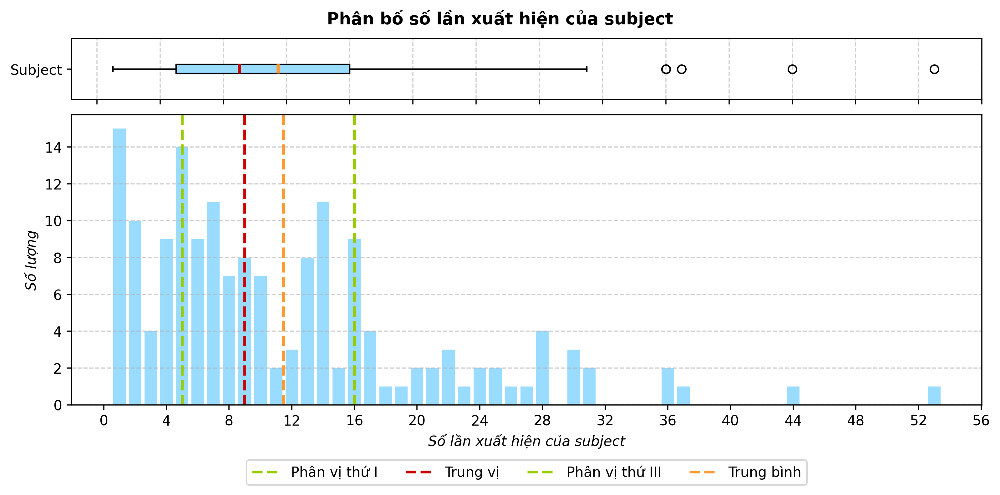

In [35]:
fig, axs = plt.subplots(5, 1, figsize=(10, 5), dpi=320, sharex=True);
fig.suptitle("Phân bố số lần xuất hiện của subject", weight="bold");

gs = axs[1].get_gridspec()
for ax in axs[1:]:
    ax.remove()
axbig = fig.add_subplot(gs[1:])

axs[0].boxplot(subject_count.Count, tick_labels=["Subject"], vert=False, patch_artist=True,
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0].grid(axis="x", linestyle="--", alpha=0.6);
modify_ticks = 4
axs[0].set_xticks(np.arange(0, max(subject_count.Count) + modify_ticks, modify_ticks));

freq_count = subject_count['Count'].value_counts().sort_index()
axbig.bar(freq_count.index, freq_count.values, width=.8, color=COLOR_LIST[-2]);
axbig.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbig.grid(axis="y", linestyle="--", alpha=0.6);
axbig.set_xlabel("Số lần xuất hiện của subject", fontdict={'style':'italic'});
axbig.set_xticks(np.arange(0, max(subject_count.Count) + modify_ticks, modify_ticks));
q1, q2, q3 = np.percentile(subject_count.Count, [25, 50, 75])
axbig.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I")
axbig.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị")
axbig.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III")
axbig.axvline(subject_count.Count.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình")
plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=4);

fig.tight_layout(pad=0.75)

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "freq_count_subject.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Số lần xuất hiện mỗi `subject` hầu hết tập trung trong $[1,31]$, với giá trị trung vị là $9$ và trung bình khoảng $11.5$.
- Phân bố hầu như không có quy luật cụ thể, mang yếu tố ngẫu nhiên, và có thiên hướng lệch dương.

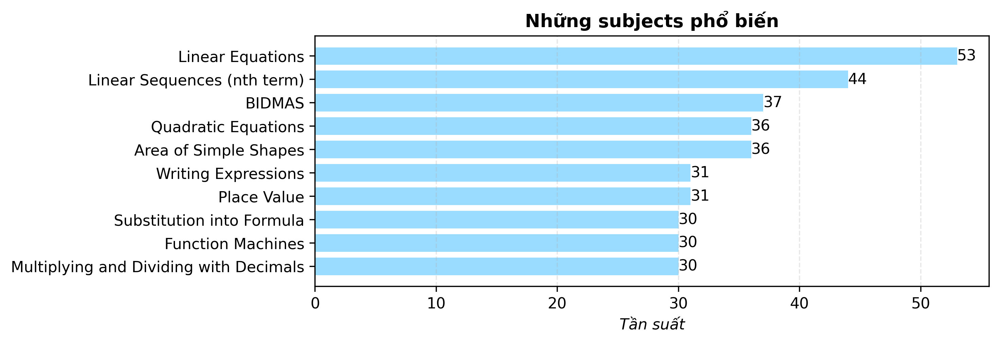

In [36]:
N_TOP = 10
top_related = subject_count.sort_values(by="Count", ascending=True).tail(N_TOP)

plt.figure(figsize=(8, 3), dpi=320);
plt.barh(top_related.SubjectName, top_related.Count, height=0.75, color=COLOR_LIST[-2]);
plt.title("Những subjects phổ biến", fontdict={"weight": "bold"});
plt.xlabel("Tần suất", fontdict={'style':'italic'});
plt.grid(axis='x', linestyle='--', alpha=0.3);

# Show labels on the bars
for i, v in enumerate(top_related.Count):
    plt.text(v, i, str(v), color='black', va='center');
    
# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_subject.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

##### Khám phá kích thước của `Subject`

- **Quan sát kích thước trên văn bản gốc:**

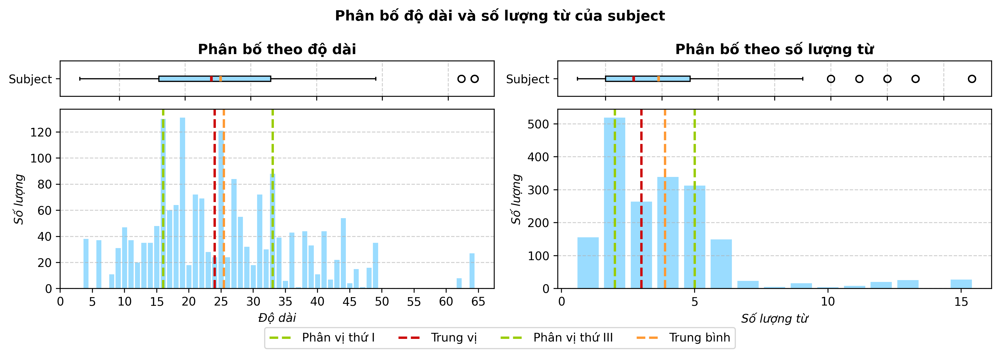

In [37]:
fig, axs = plt.subplots(5, 2, figsize=(12, 4), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của subject", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()

subject_length = eda_train.SubjectName.apply(len)
axbl.bar(subject_length.value_counts().index, subject_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(subject_length, [25, 50, 75])
mean_line = subject_length.mean()
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 5
axbl.set_xticks(np.arange(0, max(subject_length) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

axs[0, 0].boxplot(subject_length, vert=False, patch_artist=True, tick_labels=["Subject"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});

subject_length = eda_train.SubjectName.apply(lambda x: len(nltk.word_tokenize(x)))
axbr.bar(subject_length.value_counts().index, subject_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(subject_length, [25, 50, 75])
mean_line = subject_length.mean()
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 5
axbr.set_xticks(np.arange(0, max(subject_length) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 1].boxplot(subject_length, vert=False, patch_artist=True, tick_labels=["Subject"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_raw_subject.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- **Phân bố độ dài:**
    - Độ dài của $\texttt{subject}$ chủ yếu tập trung trong khoảng từ $15$ đến $33$ ký tự, với trung vị $24$;
    - Vẫn có một số $\texttt{subject}$ có độ dài xuất hiện ở các giá trị lớn hơn $50$ ký tự, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$.

- **Phân bố số lượng từ:** Nhóm sử dụng hàm $\texttt{word\_tokenize}$ của thư viện $\texttt{nltk}$ để đếm số lượng từ trong $\texttt{subject}$:
    - Số lượng từ $\texttt{subject}$ tập trung nhiều ở khoảng từ $2$ đến $5$, với với trung vị $3$;
    - Vẫn có một số $\texttt{subject}$ có số lượng từ xuất hiện ở các giá trị lớn hơn $10$, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
    - Giá trị trung bình cao hơn trung vị, cho thấy dữ liệu có thể bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

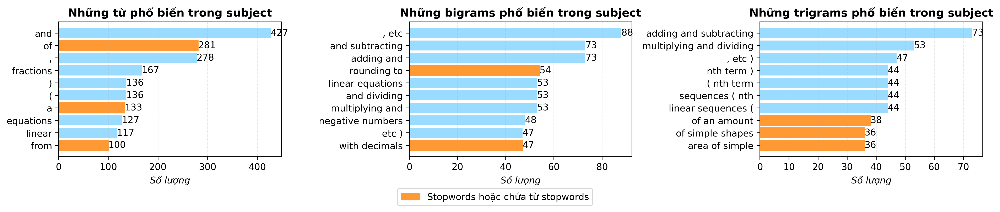

In [38]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(eda_train.SubjectName.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong subject", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');
for index, word in enumerate(top_words.Word):
    if word in stopwords:
        axs[0].get_children()[index].set_color(DARK_COLOR_LIST[1])
fig.legend(["Stopwords hoặc chứa từ stopwords"], loc="lower center", bbox_to_anchor=(0.5, -0.075), ncol=2);

axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong subject", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
for index, bigram in enumerate(bigram_count):
    if bigram[0][0] in stopwords or bigram[0][1] in stopwords:
        axs[1].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong subject", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
for index, trigram in enumerate(trigram_count):
    if trigram[0][0] in stopwords or trigram[0][1] in stopwords or trigram[0][2] in stopwords:
        axs[2].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_raw_subject.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_ Ta thấy những từ và $\texttt{n-grams}$ phổ biến nhất trong $\texttt{subject}$ xuất hiện một số từ ít cung cấp nhiều ý nghĩa $\texttt{stopwords}$.

- **Xây dựng hàm tiền xử lý cho dữ liệu văn bản:**

In [39]:
def preprocess_text_subject_construct(text:str):
    # Lower case
    text = text.lower()
    # Repace "n't" in string to "not"
    text = re.sub(r"n't", "not", text)
    # Remove punctuation, but punctuation with number digital need not remove
    text = re.sub(r'(?<!\d)[!?.,;:’“”\'\"\(\)\[\]\{\}]|[!?.,;:’“”\'\"\(\)\[\]\{\}](?!\d)','', text)
    # Convert by Lemmatizer
    wnl = WordNetLemmatizer()
    text = " ".join([wnl.lemmatize(word, pos='v') for word in text.split()])
    text = " ".join([wnl.lemmatize(word, pos='n') for word in text.split()])
    # Remove stopwords
    text = " ".join([word for word in text.split() if word not in stopwords])
    # Remove extra spaces
    text = re.sub(r"\s+", " ", text)
    return text

eda_train.SubjectName = eda_train.SubjectName.apply(preprocess_text_subject_construct)

- **Sự thay đổi sau khi đã tiền xử lý dữ liệu văn bản:**

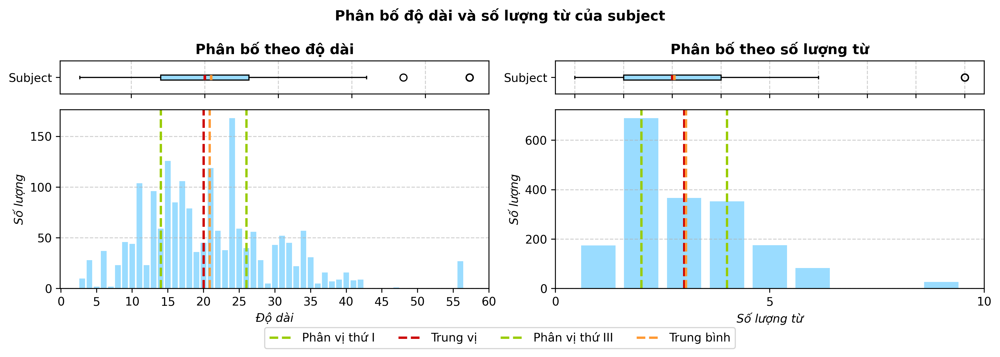

In [40]:
fig, axs = plt.subplots(5, 2, figsize=(12, 4), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của subject", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()

subject_length = eda_train.SubjectName.apply(len)
axbl.bar(subject_length.value_counts().index, subject_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(subject_length, [25, 50, 75])
mean_line = subject_length.mean()
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 5
axbl.set_xticks(np.arange(0, max(subject_length) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

axs[0, 0].boxplot(subject_length, vert=False, patch_artist=True, tick_labels=["Subject"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});

subject_length = eda_train.SubjectName.apply(lambda x: len(nltk.word_tokenize(x)))
axbr.bar(subject_length.value_counts().index, subject_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(subject_length, [25, 50, 75])
mean_line = subject_length.mean()
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 5
axbr.set_xticks(np.arange(0, max(subject_length) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 1].boxplot(subject_length, vert=False, patch_artist=True, tick_labels=["Subject"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_preprocessed_subject.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

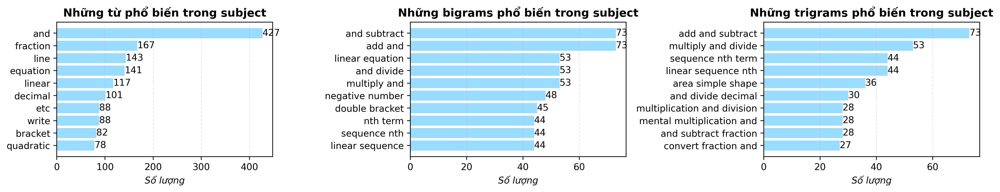

In [41]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(eda_train.SubjectName.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong subject", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');

axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong subject", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong subject", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_preprocessed_subject.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Phân bố độ dài:
    - Độ dài của các $\texttt{subject}$ giảm từ 24 xuống còn khoảng 19 ký tự, tập trung trong $[14,26]$ ký tự. Việc này làm văn bản gọn hơn, giảm nhiễu và chuẩn hóa tốt hơn;
    - Sự giảm độ dài giúp mô hình xử lý nhanh hơn và cải thiện tính tổng quát khi áp dụng lên dữ liệu mới.
    
- Phân bố số lượng từ:
    - Số lượng từ tập trung trong $[2,4]$ từ. Văn bản tinh gọn, chỉ giữ lại từ mang ý nghĩa cốt lõi;
    - Biểu đồ phân bố đã hạn chế được đuôi phải dày, thu hẹp khoảng cách giá trị trung bình và trung vị;
    - Điều này giúp mô hình tập trung vào đặc trưng quan trọng, giảm nhầm lẫn và tối ưu tài nguyên huấn luyện.

- Những từ và $\texttt{n-grams}$ phổ biến:
    - Các từ và $\texttt{n-grams}$ phổ biến sau xử lý có tính đồng nhất cao, tập trung vào từ khóa quan trọng nhờ loại bỏ $\texttt{stopwords}$ và chuẩn hóa;
    - Sự đồng nhất này cải thiện khai thác đặc trưng ngữ nghĩa, nâng cao hiệu suất mô hình học sâu.

##### Khám phá chủ đề nội dung văn bản của `Subject`

Mục tiêu của phần này là bao quát hóa chủ đề chính (đại số, hình học...) có trong tập dữ liệu, nhằm giảm kích thước hoặc tập hợp những văn bản có cùng chủ đề với nhau.

In [42]:
eda_train = train_df[["SubjectName"]].copy()
eda_train.SubjectName = eda_train.SubjectName.apply(lambda text: str.lower(text))
eda_train.sample(5)

,SubjectName
861,averages and range from frequency table
38,adding and subtracting algebraic fractions
55,mental addition and subtraction
257,length units
1761,measuring angles


- **TF-IDF encoding + K-mean clustering cho `subject`:**

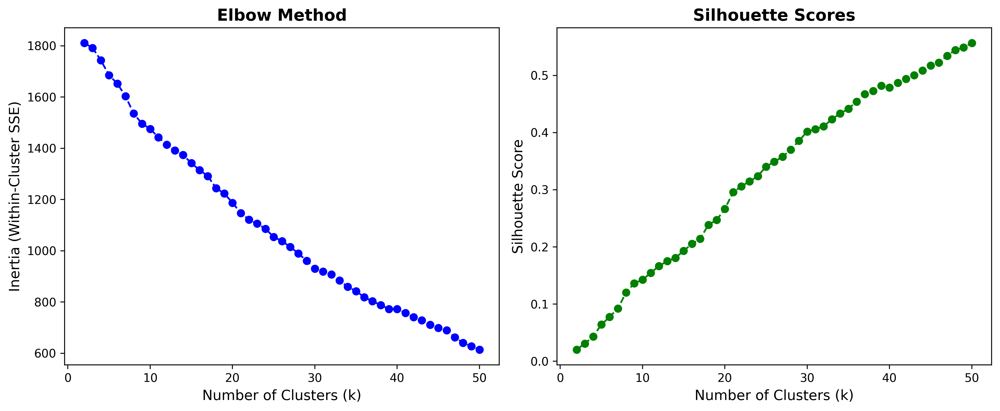

Optimal k (Elbow Method): 50
Optimal k (Silhouette Score): 50


In [43]:
# TF-IDF encoding with a simple whitespace tokenizer
vectorizer = TfidfVectorizer(tokenizer=lambda text: text.split(), stop_words='english')
tfidf_matrix = vectorizer.fit_transform(eda_train.SubjectName)

# Define the range of k values to evaluate
k_values = range(2, 51)
inertia_values = []
silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(tfidf_matrix)
    inertia_values.append(kmeans.inertia_)  # Sum of squared distances to cluster centers
    silhouette_scores.append(silhouette_score(tfidf_matrix, kmeans.labels_))

# Plot Elbow Method
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(k_values, inertia_values, marker='o', linestyle='--', color='b')
plt.title('Elbow Method', fontsize=14, weight='bold')
plt.xlabel('Number of Clusters (k)', fontsize=12)
plt.ylabel('Inertia (Within-Cluster SSE)', fontsize=12)

# Plot Silhouette Scores
plt.subplot(1, 2, 2)
plt.plot(k_values, silhouette_scores, marker='o', linestyle='--', color='g')
plt.title('Silhouette Scores', fontsize=14, weight='bold')
plt.xlabel('Number of Clusters (k)', fontsize=12)
plt.ylabel('Silhouette Score', fontsize=12)

plt.tight_layout()
plt.show()

# Print the optimal k values
optimal_k_elbow = k_values[inertia_values.index(min(inertia_values, key=lambda x: x))]
optimal_k_silhouette = k_values[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal k (Elbow Method): {optimal_k_elbow}")
print(f"Optimal k (Silhouette Score): {optimal_k_silhouette}")

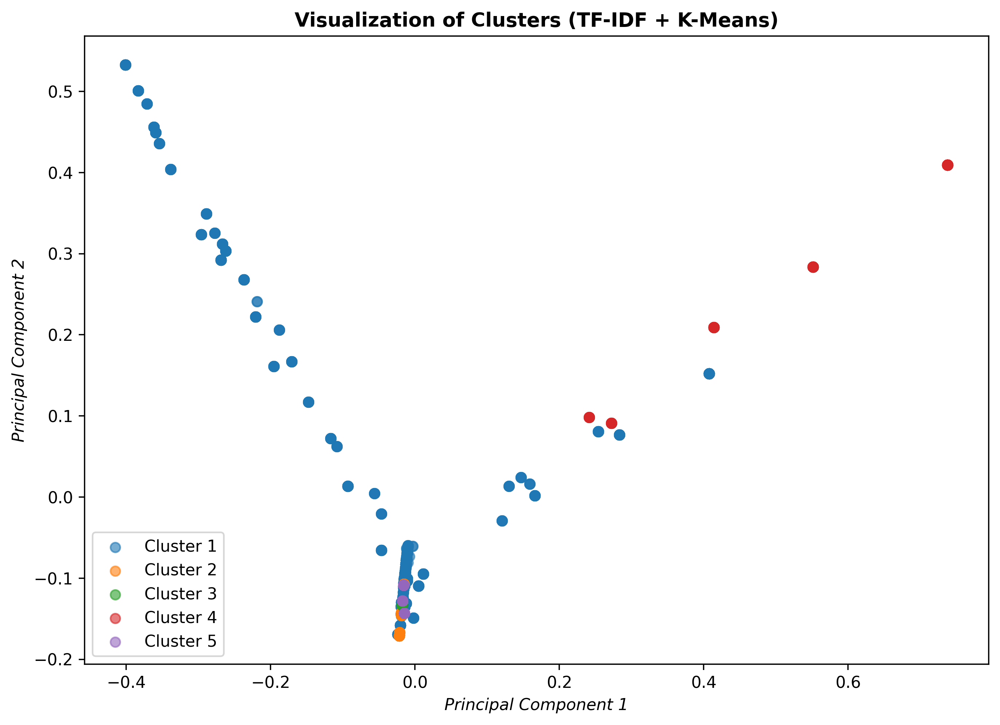

In [44]:
# TF-IDF encoding with a simple whitespace tokenizer
vectorizer = TfidfVectorizer(tokenizer=lambda text: text.split(), stop_words='english')
tfidf_matrix = vectorizer.fit_transform(eda_train.SubjectName)

# Perform K-means clustering
num_clusters = 5  # Example number of clusters
kmeans = KMeans(n_clusters=num_clusters)
labels = kmeans.fit_predict(tfidf_matrix)

# Dimensionality reduction using PCA
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(tfidf_matrix.toarray())

# Scatter plot of the clusters
plt.figure(figsize=(10, 7))
for cluster in range(num_clusters):
    cluster_points = reduced_data[labels == cluster]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster + 1}', alpha=0.6)

plt.title('Visualization of Clusters (TF-IDF + K-Means)', weight='bold')
plt.xlabel('Principal Component 1', style='italic')
plt.ylabel('Principal Component 2', style='italic')
plt.legend()
plt.show()

_Nhận xét:_
- Kết quả cho thấy việc gom nhóm như vậy khá tệ, không làm nổi bật được đặc điểm khác biệt của từng nhóm chủ đề chính bới chúng đang có sự chồng chéo lẫn nhau.

- **Sử dụng LLM cho `subject`:**
 
Nhóm cung cấp dữ liệu `SubjectName` vào LLM và yêu cầu nó thực hiện phân cụm ngữ nghĩa. Chi tiết kết quả phân tích có thể theo dõi tại [script](https://drive.google.com/file/d/1u1wvyWkiPQ6COM_bSlVj23I9wh1U_EWD/view?usp=drive_link) này.

Kết quả: Có 8 nhóm chính được phát hiện từ các tên chủ đề:  
- `Number Operations`: Bao gồm các bài toán về `Basic Operations` (Phép toán cơ bản), `Negative Numbers` (Số âm), `Decimals` (Số thập phân), `Fractions` (Phân số), `Percentages` (Phần trăm), `Factors and Multiples` (Ước số và Bội số), `Estimations` (Xấp xỉ).  
- `Algebra`: Bao gồm các bài toán về `Basic Algebra` (Đại số cơ bản), `Equations` (Phương trình), `Algebraic Fractions` (Phân số đại số), `Brackets` (Dấu ngoặc), `Factoring` (Phân tích đa thức).  
- `Geometry`: Bao gồm các bài toán về `2D Shapes` (Hình học 2D), `3D Shapes` (Hình học 3D), `Angles` (Góc), `Lines` (Đường thẳng), `Transformation` (Phép biến đổi).  
- `Function and Graphs`: Bao gồm các bài toán về `Coordinate Geometry` (Hình học tọa độ), `Linear Functions` (Hàm tuyến tính), `Non-Linear Functions` (Hàm phi tuyến), `Sequences and Pattern` (Dãy số và Mẫu hình).  
- `Measurement`: Bao gồm các bài toán về `Length and Area` (Chiều dài và Diện tích), `Volume` (Thể tích), `Scale and Proportion` (Tỷ lệ và Tỉ lệ thức), `Other Units` (Các đơn vị khác).  
- `Statistics and Data`: Bao gồm các bài toán về `Data Representation` (Biểu diễn dữ liệu), `Data Analysis` (Phân tích dữ liệu), `Probability` (Xác suất).  
- `Sequence and Pattern`: Bao gồm các bài toán về `Number Sequences` (Dãy số).  
- `Advance Topics`: Bao gồm các bài toán về `Trigonometry` (Lượng giác), `Pythagoras` (Định lý Pythagoras), `Indicies and Surds` (Lũy thừa và Căn bậc hai), `Proportion` (Tỉ lệ), và `Other Advanced` (Các chủ đề nâng cao khác).

In [45]:
def create_math_categories(df:pd.DataFrame):
    # Check df has the column `SubjectName`
    if "SubjectName" not in df.columns:
        print("The input DataFrame must have the column `SubjectName`")
        return df
    
    # The categorized list of subject
    math_categories = {
        "Number Operations": {
            "Basic Operations": [
                "counting",
                "mental addition and subtraction",
                "mental multiplication and division",
                "written addition",
                "written subtraction",
                "written multiplication",
                "written division",
                "combining operations",
                "basic calculator use",
                "brackets, indices, division, multiplication, addition, subtraction",
                "place value"
            ],
            "Negative Numbers": [
                "ordering negative numbers",
                "adding and subtracting negative numbers",
                "multiplying and dividing negative numbers"
            ],
            "Decimals": [
                "adding and subtracting with decimals",
                "multiplying and dividing with decimals",
                "ordering decimals",
                "rounding to decimal places",
                "rounding to the nearest whole (10, 100, etc)",
                "rounding to significant figures",
                "converting between decimals and percentages"
            ],
            "Fractions": [
                "simplifying fractions",
                "equivalent fractions",
                "ordering fractions",
                "fractions of an amount",
                "adding and subtracting fractions",
                "multiplying fractions",
                "dividing fractions",
                "converting mixed number and improper fractions",
                "converting between fractions and decimals",
                "converting between fractions and percentages",
                "recurring decimals to fractions"
            ],
            "Percentages": [
                "percentages of an amount",
                "percentage increase and decrease"
            ],
            "Factors and Multiples": [
                "factors and highest common factor",
                "multiples and lowest common multiple"
            ],
            "Estimation": [
                "types, naming and estimating",
                "estimation"
            ]
        },
        "Algebra": {
            "Basic Algebra": [
                "writing expressions",
                "simplifying expressions by collecting like terms",
                "writing formula",
                "substitution into formula",
                "multiplying terms",
                "function machines"
            ],
            "Equations": [
                "linear equations",
                "rearranging formula and equations",
                "simultaneous equations",
                "quadratic equations",
                "solving linear inequalities",
                "solving quadratic inequalities",
                "trial and improvement and iterative methods"
            ],
            "Algebraic Fractions": [
                "simplifying algebraic fractions",
                "adding and subtracting algebraic fractions",
                "multiplying and dividing algebraic fractions"
            ],
            "Brackets and Factoring": [
                "expanding single brackets",
                "expanding double brackets",
                "expanding triple brackets and more",
                "factorising into a single bracket",
                "factorising into a double bracket",
                "difference of two squares"
            ]
        },
        "Geometry": {
            "2D Shapes": [
                "properties of triangles",
                "properties of quadrilaterals",
                "properties of polygons",
                "2d names and properties of shapes-others",
                "parts of a circle",
                "construct triangle"
            ],
            "3D Shapes": [
                "names and properties of 3d shapes",
                "nets"
            ],
            "Angles": [
                "measuring angles",
                "basic angle facts (straight line, opposite, around a point, etc)",
                "angles in triangles",
                "angles in polygons",
                "angle facts with parallel lines",
                "construct angle"
            ],
            "Lines": [
                "parallel lines",
                "perpendicular lines",
                "horizontal and vertical lines"
            ],
            "Transformations": [
                "translation and vectors",
                "reflection",
                "rotation",
                "enlargement",
                "line symmetry",
                "rotational symmetry"
            ]
        },
        "Measurement": {
            "Length and Area": [
                "length units",
                "perimeter",
                "area units",
                "area of simple shapes",
                "compound area",
                "missing lengths"
            ],
            "Volume": [
                "volume of prisms",
                "volume of non-prisms",
                "volume and capacity units",
                "surface area of prisms"
            ],
            "Scale and Proportion": [
                "length scale factors in similar shapes",
                "length, area and volume scale factors"
            ],
            "Other Units": [
                "time",
                "weight units",
                "temperature units",
                "basic money",
                "currency conversions"
            ]
        },
        "Statistics and Data": {
            "Data Representation": [
                "frequency tables",
                "pictogram",
                "block graphs and bar charts",
                "pie chart",
                "time series and line graphs",
                "types of data and questionnaires"
            ],
            "Data Analysis": [
                "averages (mean, median, mode) from a list of data",
                "range and interquartile range from a list of data",
                "averages and range from frequency table",
                "averages and range from grouped data"
            ],
            "Probability": [
                "probability of single events",
                "experimental probability and relative frequency",
                "combined events",
                "tree diagrams with dependent events",
                "systematic listing strategies"
            ]
        },
        "Functions and Graphs": {
            "Coordinate Geometry": [
                "naming co-ordinates in 2d",
                "distance between two co-ordinates",
                "midpoint between two co-ordinates",
                "co-ordinate geometry with straight lines"
            ],
            "Linear Functions": [
                "plotting lines from tables of values",
                "finding the equation of a line",
                "finding the gradient and intercept of a line from the equation",
                "gradient as change in y over change in x",
                "gradient between two co-ordinates",
                "straight line graphs-others"
            ],
            "Non-Linear Functions": [
                "plotting quadratics from tables of values",
                "quadratic graphs-others",
                "sketching from factorised form",
                "sketching from completing the square form",
                "graphs of exponentials and other powers of x",
                "cubics and reciprocals",
                "transformations of functions in the form f(x)",
                "equation of a circle",
                "real life graphs",
                "other graphs-others"
            ]
        },
        "Sequences and Pattern": {
            "Number Sequences": [
                "linear sequences (nth term)",
                "quadratic sequences",
                "other sequences",
                "sequences-others"
            ]
        },
        "Advanced Topics": {
            "Trigonometry": [
                "right-angled triangles (sohcahtoa)",
                "exact values of trigonometric ratios"
            ],
            "Pythagoras": [
                "2d pythagoras"
            ],
            "Indices and Surds": [
                "laws of indices",
                "square roots, cube roots, etc",
                "squares, cubes, etc",
                "simplifying surds",
                "operations with surds"
            ],
            "Proportion": [
                "direct proportion",
                "indirect (inverse) proportion",
                "sharing in a ratio",
                "writing ratios"
            ],
            "Other Advanced": [
                "standard form",
                "upper and lower bounds",
                "algebraic proof",
                "completing the square",
                "graphical solution of simultaneous equations",
                "graphing linear inequalities (shading regions)",
                "quadratic inequalities on number lines",
                "inequalities on number lines",
                "venn diagrams",
                "bearings",
                "congruency in other shapes",
                "speed, distance, time"
            ]
        }
    }
    topic_to_category = {}
    topic_to_subcategory = {}

    # Function to find the corresponding category for a topic
    for category, subcats in math_categories.items():
        for subcat, topics in subcats.items():
            for topic in topics:
                topic_to_category[topic] = category
                topic_to_subcategory[topic] = subcat

    # Then use with pandas
    df['SubjectMainCategory'] = df['SubjectName'].map(topic_to_category)
    df['SubjectSubCategory'] = df['SubjectName'].map(topic_to_subcategory)
    
    return df

In [46]:
eda_train = create_math_categories(eda_train)
eda_train.sample(5)

,SubjectName,SubjectMainCategory,SubjectSubCategory
53,properties of quadrilaterals,Geometry,2D Shapes
257,length units,Measurement,Length and Area
604,multiplying and dividing with decimals,Number Operations,Decimals
1112,percentages of an amount,Number Operations,Percentages
1834,place value,Number Operations,Basic Operations


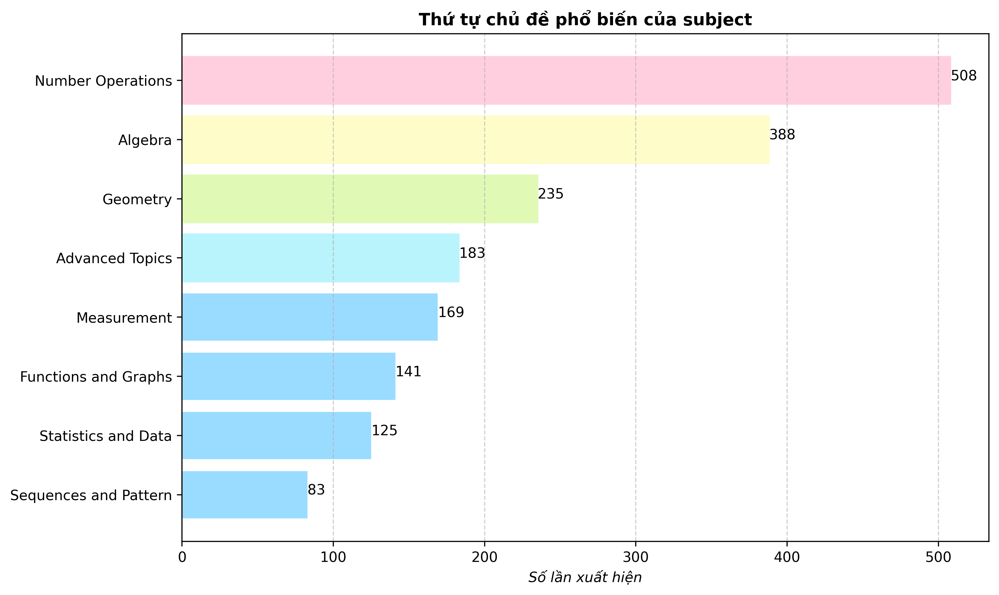

In [47]:
top_categories = eda_train.SubjectMainCategory.value_counts().sort_values()
plt.figure(figsize=(10, 6), dpi=320);
plt.barh(top_categories.index, top_categories.values, color=COLOR_LIST[-2]);
plt.title(f"Thứ tự chủ đề phổ biến của subject", weight='bold');
plt.xlabel("Số lần xuất hiện", style='italic');
plt.grid(axis='x', linestyle='--', alpha=0.6);

for index, value in enumerate(top_categories):
    plt.text(value, index, str(value))
    
for i in range(4):
    plt.gca().get_children()[7-i].set_color(COLOR_LIST[i])

plt.tight_layout();

_Nhận xét:_
- ...

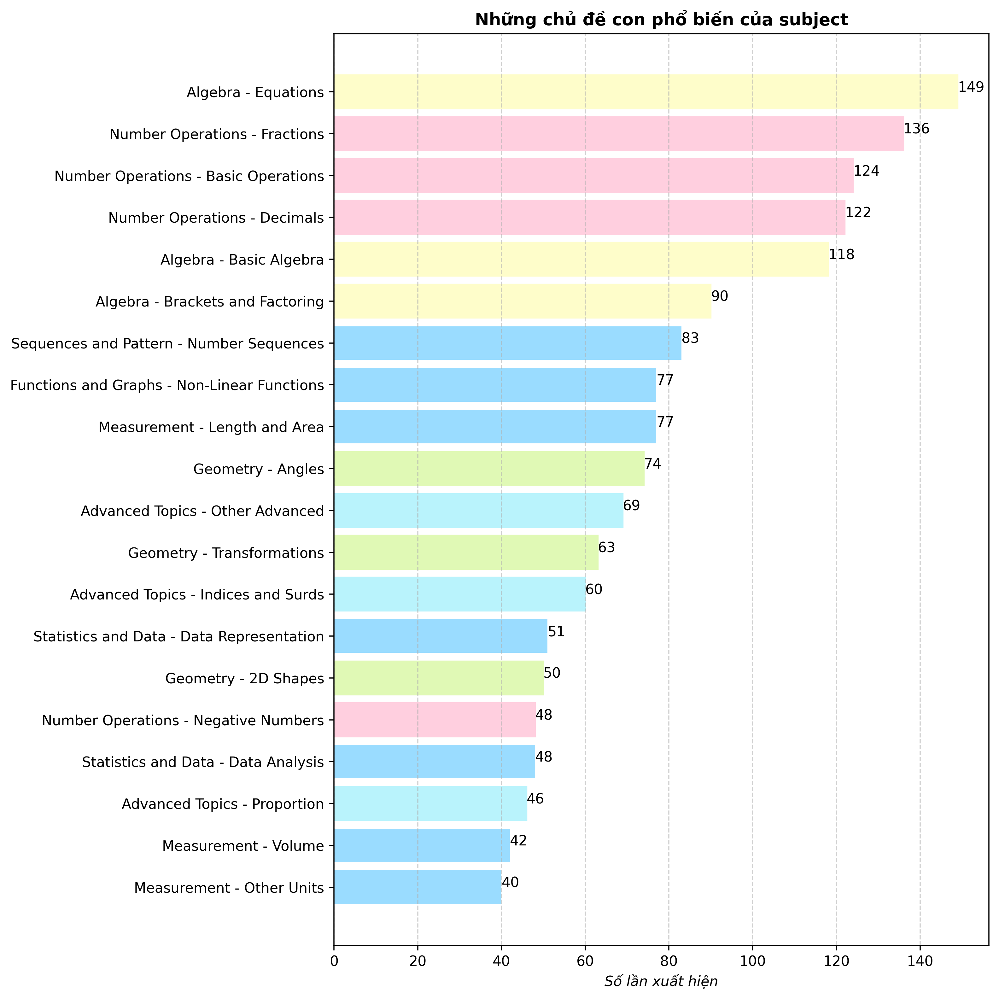

In [48]:
# Create a new column for main category + '-' + subcategory
eda_train['Category'] = eda_train['SubjectMainCategory'] + ' - ' + eda_train['SubjectSubCategory']

# Plot barh for the N_TOP most common subcategories
N_TOP = 20
top_subcategories = eda_train.Category.value_counts().sort_values().tail(N_TOP)
plt.figure(figsize=(10, 10), dpi=320);
plt.barh(top_subcategories.index, top_subcategories.values, color=COLOR_LIST[-2]);
plt.title(f"Những chủ đề con phổ biến của subject", weight='bold');
plt.xlabel("Số lần xuất hiện", style='italic');
plt.grid(axis='x', linestyle='--', alpha=0.6);

for index, value in enumerate(top_subcategories):
    plt.text(value, index, str(value))
    
for i in range(4):
    for j in range(N_TOP):
        if top_subcategories.index[j].split(" - ")[0] == top_categories.sort_values(ascending=False).index[i]:
            plt.gca().get_children()[j].set_color(COLOR_LIST[i])
    
plt.tight_layout();

_Nhận xét:_
- ...

In [49]:
preprocessed_train = create_math_categories(preprocessed_train)
preprocessed_train.sample(5)

,QuestionId,ConstructId,ConstructName,SubjectId,SubjectName,CorrectAnswer,QuestionText,AnswerAText,AnswerBText,AnswerCText,AnswerDText,MisconceptionId,SubjectMainCategory,SubjectSubCategory
5063,1325_C,18,Write 3 digit numbers as words,202,Place Value,B,How do you write this number in words?\n\( 107 \),Ten seven,One hundred and seven,One hundred and seventy,Seventeen,1244,NaN,NaN
163,163_A,1428,Factorise a quadratic expression in the form x...,53,Factorising into a Double Bracket,C,When factorising \( x^{2}+5 x+6 \) we need two...,Add to give \( 6 \) and multiply to give \( 5 \),Add to give \( 6 x \) and multiply to give \( ...,Add to give \( 5 \) and multiply to give \( 6 \),Add to give \( 5 x \) and multiply to give \( ...,2142,NaN,NaN
3797,59_C,578,Calculate percentage of an amount mentally whe...,233,Percentages of an Amount,B,\( 130 \% \) of \( 40= \),\( 12 \),\( 52 \),\( 170 \),Impossible as you cannot have a percentage gre...,2206,NaN,NaN
6993,1386_D,1615,Add algebraic fractions with the same denominator,1078,Adding and Subtracting Algebraic Fractions,B,Write this as a single fraction as simply as p...,\( \frac{5 x}{x^{2}} \),\( \frac{5}{x} \),\( \frac{5}{2 x} \),\( \frac{6}{x^{2}} \),1075,NaN,NaN
316,316_A,224,Round numbers between 0 and 1 to two significa...,214,Rounding to Decimal Places,B,Which of the numbers is the same when rounded ...,\( 23.725 \),\( 0.391 \),\( 0.038 \),\( 0.0599 \),739,NaN,NaN


#### Khám phá `Construct`

In [50]:
eda_train = train_df[["ConstructId", "ConstructName"]].copy()

##### Khám phá phân bố các loại `Construct`

In [51]:
construct_count = eda_train.value_counts().reset_index()
construct_count.columns = ["ConstructId", "ConstructName", "Count"]

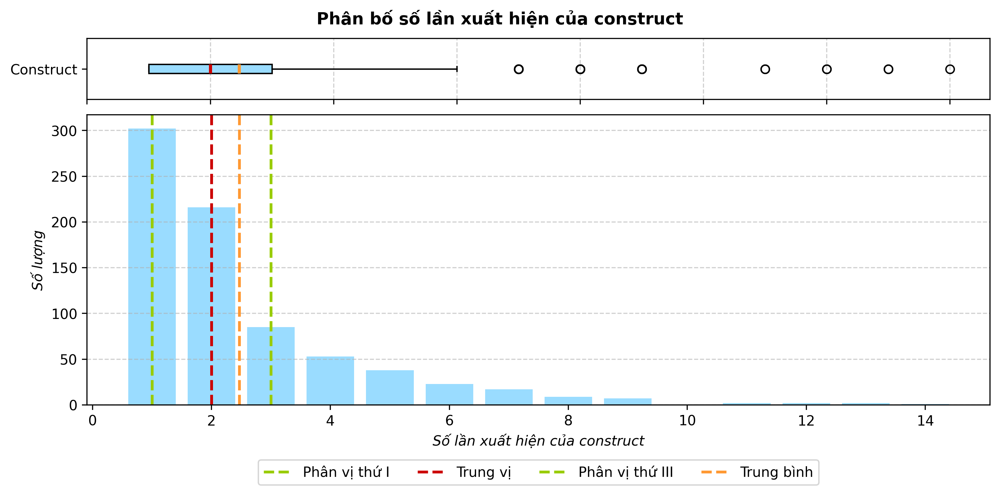

In [52]:
fig, axs = plt.subplots(5, 1, figsize=(10, 5), dpi=320, sharex=True);
fig.suptitle("Phân bố số lần xuất hiện của construct", weight="bold");

gs = axs[1].get_gridspec()
for ax in axs[1:]:
    ax.remove()
axbig = fig.add_subplot(gs[1:])

axs[0].boxplot(construct_count.Count, tick_labels=["Construct"], vert=False, patch_artist=True,
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0].grid(axis="x", linestyle="--", alpha=0.6);
modify_ticks = 2
axs[0].set_xticks(np.arange(0, max(construct_count.Count) + modify_ticks, modify_ticks));

freq_count = construct_count['Count'].value_counts().sort_index()
axbig.bar(freq_count.index, freq_count.values, width=.8, color=COLOR_LIST[-2]);
axbig.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbig.grid(axis="y", linestyle="--", alpha=0.6);
axbig.set_xlabel("Số lần xuất hiện của construct", fontdict={'style':'italic'});
axbig.set_xticks(np.arange(0, max(construct_count.Count) + modify_ticks, modify_ticks));
q1, q2, q3 = np.percentile(construct_count.Count, [25, 50, 75])
axbig.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I")
axbig.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị")
axbig.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III")
axbig.axvline(construct_count.Count.mean(), color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình")
plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=4);

fig.tight_layout(pad=0.75)

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "freq_count_construct.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Số lần xuất hiện của hầu hết các loại \texttt{construct} tập trung trong $[1,3]$, với giá trị trung vị là $2$ và trung bình khoảng $2.5$. Bên cạnh đó, một số $\texttt{construct}$ mà số lần xuất hiện lớn hơn $6$ có tần suất thấp hơn đáng kể;
- Phân bố có thiên hướng lệch dương mạnh;
- Phân bố số lần xuất hiện của $\texttt{construct}$ và mối quan hệ giữa chúng có xu hướng tuân theo phân phối bậc tuân theo quy luật lũy thừa (power-law).

Slope: -2.274273829477023
Intercept: 6.721734202631855
R-squared: 0.9225515372036349
P-value: 1.8866639899702487e-07
Standard error: 0.1986815292111709


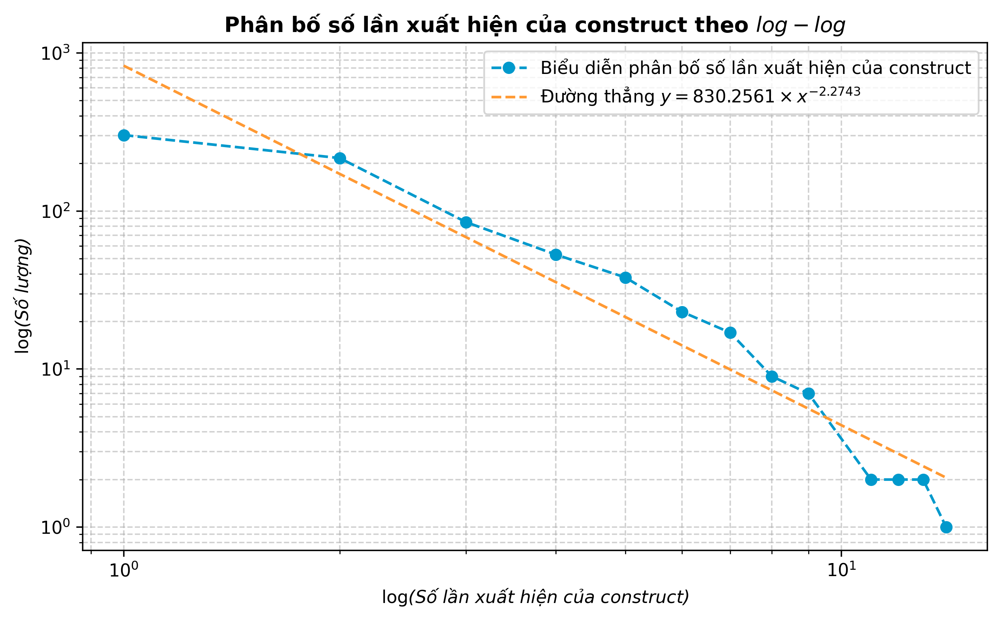

In [53]:
# Predict parameters for the linear regression model to fit the log-log scale
log_freq_count = np.log(freq_count.values)
log_count_constructs = np.log(freq_count.index)
# slope, intercept = np.polyfit(log_count_constructs, log_freq_count, 1)
slope, intercept, r_value, p_value, std_err = stats.linregress(log_count_constructs, log_freq_count)
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")

# Plot the linear regression line with slope and intercept
plt.figure(figsize=(8, 5), dpi=320);
plt.plot(freq_count.index, freq_count.values, marker="o", color=DARK_COLOR_LIST[-2], linestyle="--");
plt.plot(freq_count.index, np.exp(intercept) * freq_count.index**slope, color=DARK_COLOR_LIST[1], linestyle="--");
plt.yscale("log")
plt.xscale("log")
plt.grid(which="both", linestyle="--", alpha=0.6)
plt.xlabel("$\\text{log}$(Số lần xuất hiện của construct)", fontdict={'style':'italic'});
plt.ylabel("$\\text{log}$(Số lượng)", fontdict={'style':'italic'});
plt.title("Phân bố số lần xuất hiện của construct theo $log-log$", fontdict={'weight':'bold'});
plt.legend(["Biểu diễn phân bố số lần xuất hiện của construct", f"Đường thẳng $y={np.exp(intercept):.4f}\\times x^{{-2.2743}}$"], loc="upper right");
plt.tight_layout();

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "freq_count_construct_log_log.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Kết quả cho thấy phân bố tuân theo phân phối bậc tuân theo quy luật lũy thừa của luật mũ xấp xỉ $2.27$ với mức độ phù hợp $92.25\%$ có độ tin cậy $99.99\%$;
- Kết quả này cho ta thấy một cách giải thích khoa học cho việc hầu hết số lần xuất hiện của $\texttt{construct}$ là 2 lần nhưng lại tồn tại một số $\texttt{construct}$ có số lần xuất hiện lớn hơn nhiều.

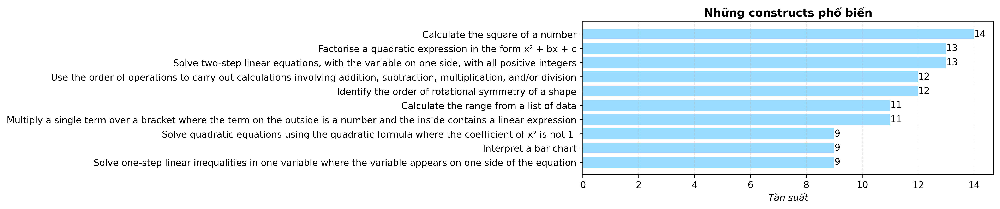

In [54]:
N_TOP = 10
top_related = construct_count.sort_values(by="Count", ascending=True).tail(N_TOP)

plt.figure(figsize=(8, 3), dpi=320);
plt.barh(top_related.ConstructName, top_related.Count, height=0.75, color=COLOR_LIST[-2]);
plt.title("Những constructs phổ biến", fontdict={"weight": "bold"});
plt.xlabel("Tần suất", fontdict={'style':'italic'});
plt.grid(axis='x', linestyle='--', alpha=0.3);

# Show labels on the bars
for i, v in enumerate(top_related.Count):
    plt.text(v, i, str(v), color='black', va='center');
    
# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_construct.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

##### Khám phá kích thước của `Construct`

- **Quan sát kích thước trên văn bản gốc:**

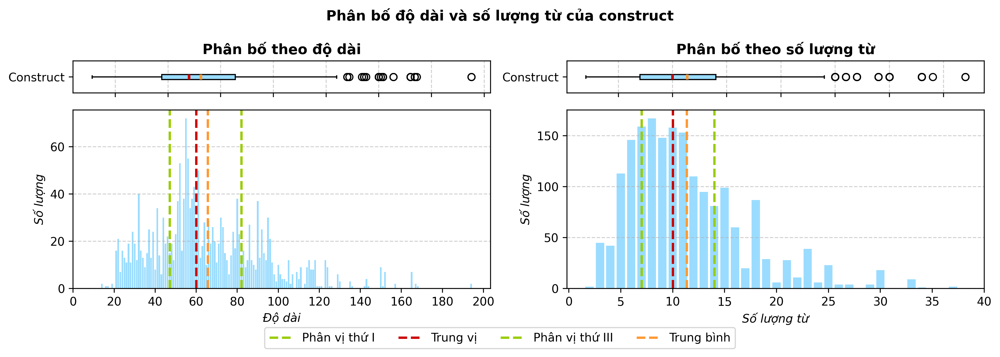

In [55]:
fig, axs = plt.subplots(5, 2, figsize=(12, 4), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của construct", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()

construct_length = eda_train.ConstructName.apply(len)
axbl.bar(construct_length.value_counts().index, construct_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(construct_length, [25, 50, 75])
mean_line = construct_length.mean()
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 20
axbl.set_xticks(np.arange(0, max(construct_length) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

axs[0, 0].boxplot(construct_length, vert=False, patch_artist=True, tick_labels=["Construct"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});

construct_length = eda_train.ConstructName.apply(lambda x: len(nltk.word_tokenize(x)))
axbr.bar(construct_length.value_counts().index, construct_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(construct_length, [25, 50, 75])
mean_line = construct_length.mean()
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 5
axbr.set_xticks(np.arange(0, max(construct_length) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 1].boxplot(construct_length, vert=False, patch_artist=True, tick_labels=["Construct"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_raw_construct.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Phân bố độ dài:
    - Độ dài của $\texttt{construct}$ chủ yếu tập trung trong khoảng từ $45$ đến $85$ ký tự, với trung vị $60$;
    - Vẫn có một số \texttt{construct} có độ dài xuất hiện ở các giá trị lớn hơn $120$ ký tự, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
    - Giá trị trung bình cao hơn trung vị, cho thấy dữ liệu bị lệch dương, cộng thêm phân bố dữ liệu bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

- Phân bố số lượng từ: Nhóm sử dụng hàm $\texttt{word\_tokenize}$ của thư viện $\texttt{nltk}$ để đếm số lượng từ trong $\texttt{construct}$:
    - Số lượng từ $\texttt{construct}$ tập trung nhiều ở khoảng từ $7$ đến $14$, với với trung vị $10$;
    - Vẫn có một số $\texttt{construct}$ có số lượng từ xuất hiện ở các giá trị lớn hơn $24$, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
    - Giá trị trung bình cao hơn trung vị, cho thấy dữ liệu bị lệch dương, cộng thêm phân bố dữ liệu bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

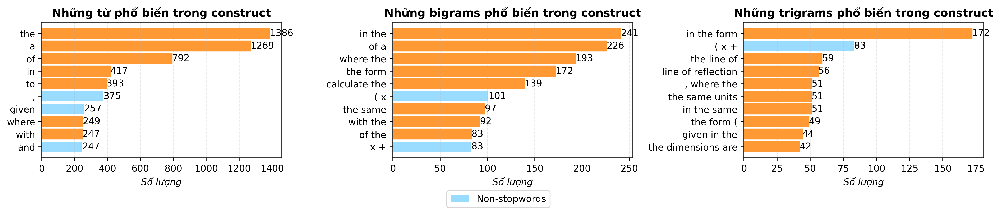

In [56]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(eda_train.ConstructName.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong construct", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');
for index, word in enumerate(top_words.Word):
    if word in stopwords:
        axs[0].get_children()[index].set_color(DARK_COLOR_LIST[1])
fig.legend(["Non-stopwords", "Stopwords hoặc chứa từ stopwords"], loc="lower center", bbox_to_anchor=(0.5, -0.075), ncol=2);

axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong construct", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
for index, bigram in enumerate(bigram_count):
    if bigram[0][0] in stopwords or bigram[0][1] in stopwords:
        axs[1].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong construct", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
for index, trigram in enumerate(trigram_count):
    if trigram[0][0] in stopwords or trigram[0][1] in stopwords or trigram[0][2] in stopwords:
        axs[2].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_raw_construct.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_ Ta thấy những từ và $\texttt{n-grams}$ phổ biến nhất trong $\texttt{construct}$ hầu hết là những từ ít cung cấp nhiều ý nghĩa $\texttt{stopwords}$.

- **Xây dựng hàm tiền xử lý cho dữ liệu văn bản:**

In [57]:
eda_train.ConstructName = eda_train.ConstructName.apply(preprocess_text_subject_construct)

- **Sự thay đổi sau khi đã tiền xử lý dữ liệu văn bản:**

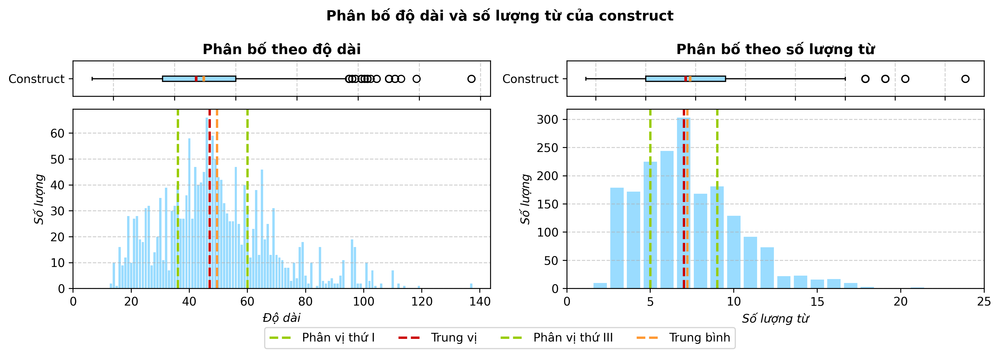

In [58]:
fig, axs = plt.subplots(5, 2, figsize=(12, 4), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của construct", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()

construct_length = eda_train.ConstructName.apply(len)
axbl.bar(construct_length.value_counts().index, construct_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(construct_length, [25, 50, 75])
mean_line = construct_length.mean()
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 20
axbl.set_xticks(np.arange(0, max(construct_length) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

axs[0, 0].boxplot(construct_length, vert=False, patch_artist=True, tick_labels=["Construct"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});

construct_length = eda_train.ConstructName.apply(lambda x: len(nltk.word_tokenize(x)))
axbr.bar(construct_length.value_counts().index, construct_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(construct_length, [25, 50, 75])
mean_line = construct_length.mean()
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 5
axbr.set_xticks(np.arange(0, max(construct_length) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 1].boxplot(construct_length, vert=False, patch_artist=True, tick_labels=["Construct"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_preprocessed_construct.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

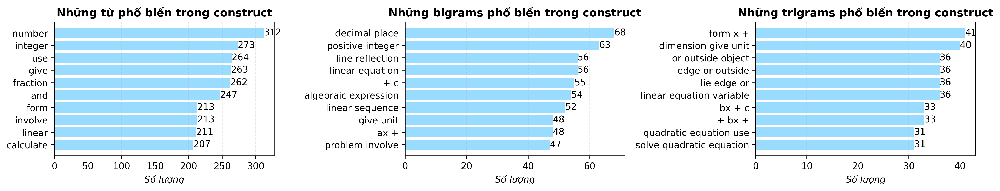

In [59]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(eda_train.ConstructName.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong construct", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');

axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong construct", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong construct", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_preprocessed_construct.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Phân bố độ dài:
    - Độ dài của các $\texttt{construct}$ giảm đáng kể, từ trung vị $60$ ký tự xuống còn khoảng $48$ ký tự, tập trung trong $[35,70]$ ký tự. Điều này cho thấy hiệu quả của các bước tiền xử lý trong việc loại bỏ nhiễu và chuẩn hóa văn bản;
    - Sự giảm này giúp đơn giản hóa dữ liệu đầu vào, giảm độ phức tạp tính toán cho mô hình và cải thiện khả năng học tập trên các đặc trưng quan trọng hơn.


- Phân bố số lượng từ:
    - Số lượng từ trong $\texttt{construct}$ giảm từ trung vị $10$ xuống khoảng $7$, tập trung chủ yếu trong $[5,9]$ từ. Điều này phản ánh việc tinh gọn văn bản, tập trung vào các thông tin cốt lõi và loại bỏ từ ít ý nghĩa;
    - Phân bố số lượng từ sau xử lý cũng thu hẹp khoảng cách giữa giá trị trung bình và trung vị, giảm thiểu đuôi phải dày, giúp mô hình nhận diện đặc trưng ngữ nghĩa dễ dàng hơn, đồng thời tối ưu tài nguyên khi huấn luyện.

- Những từ và $\texttt{n-grams}$ phổ biến:
    - Các từ và $\texttt{n-grams}$ phổ biến trở nên đồng nhất và tập trung hơn vào từ khóa sau khi loại bỏ stopwords và thực hiện $\texttt{lemmatization}$. Điều này làm nổi bật các yếu tố quan trọng trong $\texttt{construct}$;
    - Việc đồng nhất hóa này không chỉ cải thiện chất lượng đặc trưng mà còn giúp mô hình dễ dàng khai thác các quan hệ ngữ nghĩa, từ đó nâng cao hiệu suất dự đoán.

##### Khám phá yêu cầu chính của nội dung văn bản `ConstructName`

Nhóm nhận thấy rằng có một cấu trúc trong một `ConstructName`. Chúng dường như có cấu trúc gồm **3 phần**, bao gồm:

- Từ đầu tiên là một động từ và chỉ ra hành động cần thực hiện. Chúng tôi sẽ gọi phần này là `action word`.  
- Phần tiếp theo mô tả đối tượng cần được lấy sau khi thực hiện hành động. Chúng tôi sẽ gọi phần này là `subject`.  
- Phần cuối cùng mô tả ngữ cảnh mà trong đó chúng ta xem xét hành động. Chúng tôi sẽ gọi phần này là `context`.

Hãy cùng xem một ví dụ:  

> `Calculate the range from a list of data`

Chúng ta có thể phân tích như sau:  
- `action word`: `Calculate`  
- `subject`: `range`  
- `context`: `list of data`  

In [60]:
eda_train = train_df[["ConstructName"]].copy()

In [61]:
math_action_verbs = {
    "calculation and arithmetic": {
        "calculate": ["Calculate the", "Calculate percentage", "Calculate a", "Calculate speed", 
                     "Calculate missing", "Calculate compound", "Calculate unit", "Calculate time",
                     "Calculate distance", "Calculate coordinates", "Calculate points", 
                     "Calculate questions", "Calculate which", "Calculate non-unit",
                     "Can calculate", "Perform calculations"],
        "add": ["Add proper", "Add algebraic", "Add fractions", "Add two", "Add decimals", 
                "Add integers", "Add amounts", "Add surds", "Add column"],
        "subtract": ["Subtract algebraic", "Subtract fractions", "Subtract decimals", 
                    "Subtract integers", "Subtract proper", "Subtract two", 
                    "Perform subtraction"],
        "multiply": ["Multiply a", "Multiply algebraic", "Multiply 2", "Multiply 3", 
                    "Multiply an", "Multiply mixed", "Multiply two", "Multiply proper", 
                    "Multiply surds", "Multiply amounts", "Mental multiplication",
                    "Multiplication law", "Multiplication, division"],
        "divide": ["Divide a", "Divide proper", "Divide two", "Divide mixed", 
                  "Divide algebraic", "Divide decimals", "Divide integers",
                  "Division law"]
    },
    
    "algebraic processes": {
        "simplify": ["Simplify an", "Simplify algebraic", "Simplify fractions"],
        "solve": ["Solve linear", "Solve two-step", "Solve one-step", "Solve a", 
                 "Solve three", "Solve quadratic", "Solve positive", "Solve problems", 
                 "Solve coordinate", "Solve basic", "Solve missing", "Solve comparison",
                 "Solve length"],
        "factorise": ["Factorise a"],
        "expand": ["Expand two", "Expand products", "Expand double"],
        "rearrange": ["Rearrange formulae", "Rearrange a"],
        "substitute": ["Substitute a", "Substitute positive", "Substitute negative", 
                      "Substitute into", "Substitute numbers"],
        "form": ["Form expressions"],
        "raise": ["Raise negative", "Raise an", "Raise a"],
        "manipulate": ["Manipulate both"]
    },
    
    "conversion and transformation": {
        "convert": ["Convert two", "Convert integer", "Convert fractions", "Convert single", 
                   "Convert from", "Convert terminating", "Convert the", "Convert between", 
                   "Convert percentages", "Convert ratios", "Convert decimals"],
        "change": ["Change an", "Change minutes", "Change decimals"],
        "transform": ["Rotate an", "Reflect an", "Enlarge a", "Translate a"],
        "reduce": ["Reduce a"]
    },
    
    "identification and recognition": {
        "identify": ["Identify a", "Identify percentages", "Identify horizontal", 
                    "Identify equivalent", "Identify questions", "Identify perpendicular", 
                    "Identify parallel", "Identify triangular", "Identify common", 
                    "Identify obtuse", "Identify reflex", "Identify corresponding",
                    "Identify cross", "Identify data", "Identify and", "Identify or",
                    "Identify pairs", "Identify non-unit", "Identify rational",
                    "Identify mathematical", "Identify factors", "Identify congruence",
                    "Identify co-interior", "Identify non-prisms", "Identify whether",
                    "Identify where", "Identify command", "Identify that", "Identify unit",
                    "Identify vertical", "Identify when", "Identify alternate",
                    "Identify multiples", "Identify the"],
        "recognise": ["Recognise visual", "Recognise cube", "Recognise the", 
                     "Recognise perpendicular", "Recognise a", "Recognise whether", 
                     "Recognise and", "Recognise when", "Recognise that", "Recognise an",
                     "Recognise other", "Recognise square", "Recognise integers",
                     "Recognise if", "Recognise graphical"],
        "distinguish": ["Distinguish between"]
    },
    
    "representation and construction": {
        "represent": ["Represent an", "Represent a", "Represent the", 
                     "Represent positive", "Represent written"],
        "draw": ["Draw the"],
        "sketch": ["Sketch curves", "Sketch, or"],
        "construct": ["Construct a", "Construct frequency", "Construct an"],
        "plot": ["Plot two"],
        "shade": ["Shade percentages"],
        "create": ["Create a"],
        "generate": ["Generate a", "Generate an"]
    },
    
    "analysis and interpretation": {
        "compare": ["Compare relative", "Compare two", "Compare sets", "Compare the",
                   "Compare real"],
        "interpret": ["Interpret a", "Interpret the", "Interpret continuous", 
                     "Interpret and", "Interpret numbers", "Interpret horizontal", 
                     "Interpret sloping", "Interpret discrete", "Interpret remainders", 
                     "Interpret what", "Interpret linear"],
        "determine": ["Determine the", "Determine if"],
        "express": ["Express one", "Express a", "Express words", "Express pictorial"],
        "understand": ["Understand inequality", "Understand the", "Understand key"],
        "estimate": ["Estimate the"]
    },
    
    "documentation and writing": {
        "write": ["Write algebraic", "Write a", "Write the", "Write 5", 
                 "Write 3", "Write numbers", "Can write"],
        "label": ["Label angles"],
        "mark": ["Mark a"],
        "complete": ["Complete missing", "Complete the", "Complete a", 
                    "Complete multi-step", "Complete mental"],
        "read": ["Read values", "Read the", "Read fractions", "Read an", "Read a",
                "Can read"],
        "describe": ["Describe the", "Describe a", "Describe simple", "Describe how",
                    "Describe an"]
    },
    
    "ordering and sorting": {
        "order": ["Order integers", "Order negative", "Order decimals", 
                 "Order fractions", "Order numbers"],
        "sort": ["Sort and"],
        "round": ["Round integers", "Round the", "Round decimals", 
                 "Round numbers", "Round non-integers"],
        "count": ["Count backwards", "Count a"]
    },
    
    "general mathematical actions": {
        "use": ["Use the", "Use facts", "Use a", "Use area", "Use inequality",
               "Use direct", "Use brackets", "Use common", "Use perimeter",
               "Use angles", "Use prime"],
        "find": ["Find the", "Find another", "Find 100", "Find missing", "Find a"],
        "prove": ["Prove statements"],
        "carry": ["Carry out", "Carry out,"],
        "work": ["Work out"],
        "answer": ["Answer fraction", "Answer negative", "Answer decimal"],
        "select": ["Select the"],
        "insert": ["Insert brackets"],
        "assign": ["Assign probabilities"],
        "continue": ["Continue a", "Continue linear"],
        "follow": ["Follow simple"],
        "match": ["Match linear"],
        "place": ["Place or"],
        "state": ["State the"],
        "tell": ["Tell the"],
        "recall": ["Recall and", "Recall the"],
        "triple": ["Triple numbers"]
    }
}

# Helper functions for analysis
def get_all_base_verbs():
    """Return a list of all base verbs without variations"""
    return [verb for category in math_action_verbs.values() for verb in category.keys()]

def get_all_verb_variations():
    """Return a list of all verb variations including base forms"""
    return [variation 
            for category in math_action_verbs.values() 
            for verb_list in category.values() 
            for variation in verb_list]

def get_verbs_by_category(category):
    """Return all verbs and their variations for a specific category"""
    if category in math_action_verbs:
        return math_action_verbs[category]
    return None

def find_category_for_verb(verb):
    """Find which category a verb belongs to"""
    verb_lower = verb.lower()
    for category, verbs in math_action_verbs.items():
        for base_verb, variations in verbs.items():
            if any(verb_lower == v.lower() for v in variations):
                return category
    return None

def verify_coverage(original_list):
    """Verify that all verbs from the original list are included in the dictionary"""
    all_variations = get_all_verb_variations()
    missing = []
    for item in original_list:
        if item not in all_variations and item not in ["Given a", "Given the", "Given an", "Given information", "For a"]:
            missing.append(item)
    return missing

In [62]:
eda_train['ConstructActionType'] = eda_train['ConstructName'].apply(lambda x: find_category_for_verb(' '.join(x.split()[:2])))

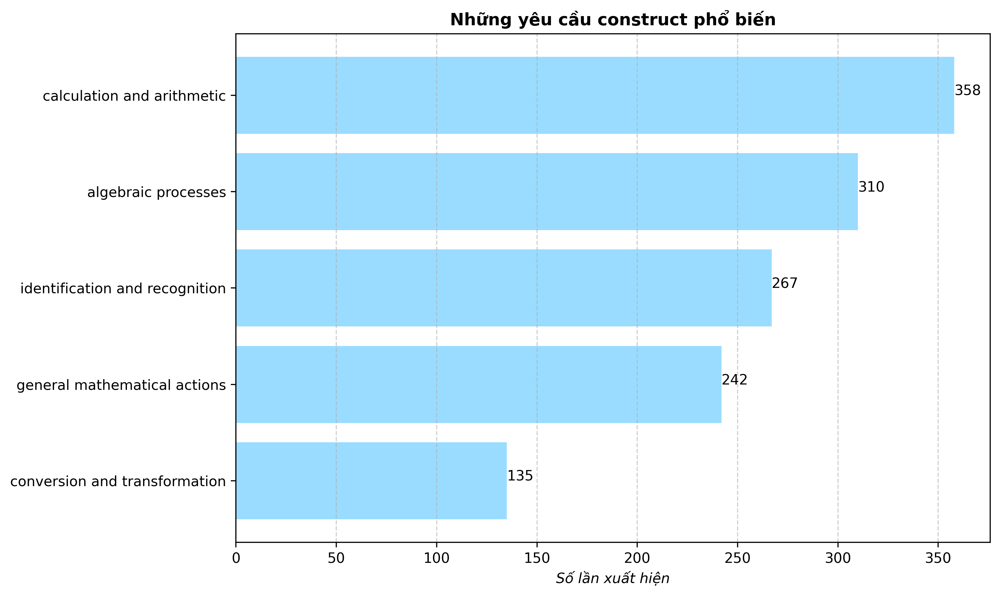

In [63]:
# Plot barh chart to show N_TOP most common action types
N_TOP = 5
top_action_types = eda_train.ConstructActionType.value_counts().sort_values().tail(N_TOP)
plt.figure(figsize=(10, 6), dpi=320);
plt.barh(top_action_types.index, top_action_types.values, color=COLOR_LIST[-2]);
plt.title(f"Những yêu cầu construct phổ biến", weight='bold');
plt.xlabel("Số lần xuất hiện", style='italic');
plt.grid(axis='x', linestyle='--', alpha=0.6);

for index, value in enumerate(top_action_types):
    plt.text(value, index, str(value))
    
plt.tight_layout();

#### Khám phá mối quan hệ giữa `MisconceptionId` với `Subject` và `Construct`

##### Khám phá mức độ bao phủ các loại `subject` và `construct` dựa trên số lần xuất hiện của từng `Misconception`

Quan sát từ dữ liệu, ta thấy dường như $\texttt{Misconception}$ xuất hiện càng nhiều thì bao phủ được nhiều loại $\texttt{Subject}$ và $\texttt{Construct}$. Cụ thể:
- Đối với mối quan hệ giữa số lần xuất hiện của \texttt{Misconception} với số lượng $\texttt{Subject}$ mà nó bao phủ, gọi giả thiết:
    - $H_0$: Số lần xuất hiện của $\texttt{Misconception}$ ảnh hưởng đến số lượng $\texttt{Subject}$ mà nó bao phủ;
    - $H_1$: Bác bỏ $H_0$, không đủ cơ sở để kết luận số lần xuất hiện của $\texttt{Misconception}$ ảnh hưởng đến số lượng $\texttt{Subject}$ mà nó bao phủ.

- Đối với mối quan hệ giữa số lần xuất hiện của $\texttt{Misconception}$ với số lượng $\texttt{Construct}$ mà nó bao phủ, gọi giả thiết:
    - $H_0$: Số lần xuất hiện của $\texttt{Misconception}$ ảnh hưởng đến số lượng $\texttt{Construct}$ mà nó bao phủ;
    - $H_1$: Bác bỏ $H_0$, không đủ cơ sở để kết luận số lần xuất hiện của $\texttt{Misconception}$ ảnh hưởng đến số lượng $\texttt{Construct}$ mà nó bao phủ.

In [64]:
eda_train = preprocessed_train[["MisconceptionId", "SubjectName", "ConstructName"]].copy()

count_misconceptions = eda_train.MisconceptionId.value_counts()
eda_train['FreqMisconception'] = eda_train.MisconceptionId.apply(lambda x: count_misconceptions.values[count_misconceptions.index.to_list().index(x)])
eda_train['NumSubjectEachMisconception'] = eda_train.groupby('MisconceptionId')['SubjectName'].transform('nunique')
eda_train['NumConstructEachMisconception'] = eda_train.groupby('MisconceptionId')['ConstructName'].transform('nunique')
eda_train = eda_train.sort_values(by=["FreqMisconception"], ascending=[True])

For subject:
Slope: 0.20399228809120773
Intercept: 0.9077336159699749
R-squared: 0.6314807750677467
P-value: 0.0
Standard error: 0.002357884037186903

For construct:
Slope: 0.40538197845240015
Intercept: 0.5960190059109385
R-squared: 0.8248263977399055
P-value: 0.0
Standard error: 0.002826676951208666



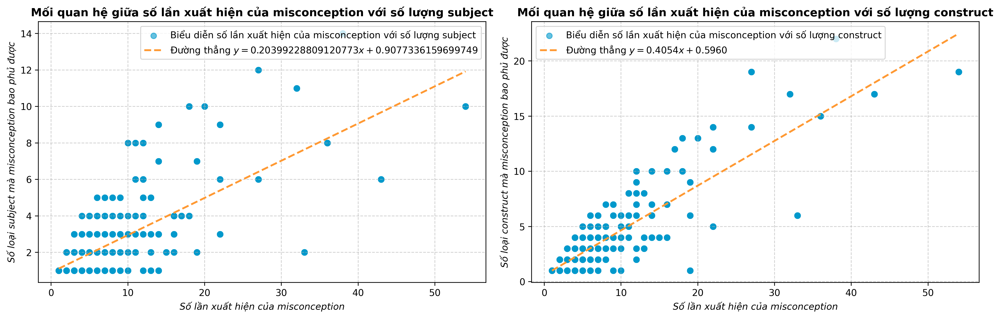

In [65]:
# Create 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5), dpi=320);

# Plot scatter plot to show the relationship between frequency of misconceptions and number of subjects
axes[0].scatter(eda_train.FreqMisconception, eda_train.NumSubjectEachMisconception, color=DARK_COLOR_LIST[-2], alpha=0.6);
axes[0].set_title("Mối quan hệ giữa số lần xuất hiện của misconception với số lượng subject", weight='bold');
axes[0].set_xlabel("Số lần xuất hiện của misconception", style='italic');
axes[0].set_ylabel("Số loại subject mà misconception bao phủ được", style='italic');
axes[0].grid(linestyle='--', alpha=0.6);
slope, intercept, r_value, p_value, std_err = stats.linregress(eda_train.FreqMisconception, eda_train.NumSubjectEachMisconception)
print(f"For subject:\nSlope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}\n")
axes[0].plot(eda_train.FreqMisconception, slope * eda_train.FreqMisconception + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axes[0].legend(["Biểu diễn số lần xuất hiện của misconception với số lượng subject", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);

axes[1].scatter(eda_train.FreqMisconception, eda_train.NumConstructEachMisconception, color=DARK_COLOR_LIST[-2], alpha=0.6);
axes[1].set_title("Mối quan hệ giữa số lần xuất hiện của misconception với số lượng construct", weight='bold');
axes[1].set_xlabel("Số lần xuất hiện của misconception", style='italic');
axes[1].set_ylabel("Số loại construct mà misconception bao phủ được", style='italic');
axes[1].grid(linestyle='--', alpha=0.6);
slope, intercept, r_value, p_value, std_err = stats.linregress(eda_train.FreqMisconception, eda_train.NumConstructEachMisconception)
print(f"For construct:\nSlope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}\n")
axes[1].plot(eda_train.FreqMisconception, slope * eda_train.FreqMisconception + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axes[1].legend(["Biểu diễn số lần xuất hiện của misconception với số lượng construct", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);

fig.tight_layout(pad=1.5);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "num_subject_construct_with_count_misconception.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Mối quan hệ giữa số lần xuất hiện của $\texttt{Misconception}$ với số lượng $\texttt{Subject}$ mà nó bao phủ:

    - Hiệp phương sai: 0.20399228809120773
    - $\texttt{R-squared}$: 0.6314807750677467
    - $\texttt{P-value}$: 0.0

- Mối quan hệ giữa số lần xuất hiện của $\texttt{Misconception}$ với số lượng $\texttt{Construct}$ mà nó bao phủ:

    - Hiệp phương sai: 0.40538197845240015
    - $\texttt{R-squared}$: 0.8248263977399055
    - $\texttt{P-value}$: 0.0
- Kết quả trên là cơ sở cho thấy $\texttt{misconception}$ xuất hiện càng nhiều thì càng bao phủ được nhiều $\texttt{subject}$ và $\texttt{construct}$, với mức độ phù hợp cao và độ tin cậy gần như tuyệt đối.
- Để tăng hiệu suất mô hình dự đoán, ta có thể hỗ trợ gom nhóm những $\texttt{subject}$ và $\texttt{construct}$ liên quan với nhau trong cùng $\texttt{misconception}$, làm giàu thông tin cho dữ liệu.


In [66]:
preprocessed_train.ConstructName = preprocessed_train.ConstructName.apply(preprocess_text_subject_construct)
preprocessed_train.SubjectName = preprocessed_train.SubjectName.apply(preprocess_text_subject_construct)

In [67]:
def addRelatedSubjectConstruct(df:pd.DataFrame, misconception_df:pd.DataFrame):
    related = df[["ConstructId", "ConstructName", "SubjectId", "SubjectName", "MisconceptionId"]].copy().drop_duplicates()
    related_mapping = misconception_df.copy()
    
    related["RelatedSubject"] = related.MisconceptionId.apply(lambda id: list(set(related[related.MisconceptionId == id]["SubjectName"].to_list())))
    related["RelatedConstruct"] = related.MisconceptionId.apply(lambda id: list(set(related[related.MisconceptionId == id]["ConstructName"].to_list())))    
    
    related_mapping = related_mapping.merge(related[["MisconceptionId", "RelatedSubject", "RelatedConstruct"]], 'inner', ["MisconceptionId"]).drop_duplicates(["MisconceptionId", "MisconceptionName"])
    
    return df.merge(related_mapping, 'left', ["MisconceptionId"])

preprocessed_train = addRelatedSubjectConstruct(preprocessed_train, misconception_df)

Slope: 1.6096725974445256
Intercept: -0.28943242810876635
R-squared: 0.856990766449654
P-value: 0.0
Standard error: 0.009949246802424882


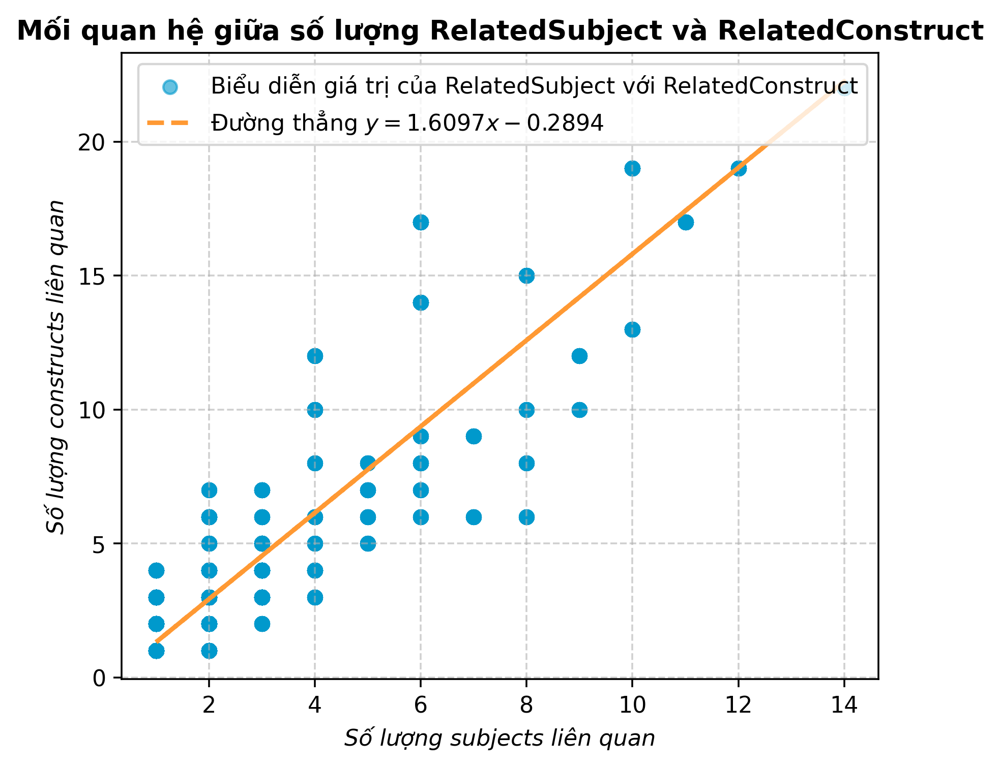

In [68]:
eda_train = preprocessed_train[["MisconceptionId", "RelatedSubject", "RelatedConstruct"]].copy()

plt.figure(figsize=(6, 5), dpi=320);
plt.scatter(eda_train.RelatedSubject.apply(len), eda_train.RelatedConstruct.apply(len), alpha=0.6, color=DARK_COLOR_LIST[-2]);
plt.title("Mối quan hệ giữa số lượng RelatedSubject và RelatedConstruct", weight="bold");
plt.xlabel("Số lượng subjects liên quan", fontdict={'style':'italic'});
plt.ylabel("Số lượng constructs liên quan", fontdict={'style':'italic'});
plt.grid(linestyle="--", alpha=0.6);

# Plot linear line for predicting the number of constructs based on the number of subjects
slope, intercept, r_value, p_value, std_err = stats.linregress(eda_train.RelatedSubject.apply(len), eda_train.RelatedConstruct.apply(len))
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
plt.plot(eda_train.RelatedSubject.apply(len), slope * eda_train.RelatedSubject.apply(len) + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
plt.legend(["Biểu diễn giá trị của RelatedSubject với RelatedConstruct", f"Đường thẳng $y={slope:.4f}x{intercept:.4f}$"]);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "num_relatedsubject_with_relatedconstruct.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- kích thước các $\texttt{subjects}$ liên quan tăng $1$ đơn vị thì kích thước các $\texttt{constructs}$ liên quan cũng tăng $1.61$ lần.
- Biểu đồ trong hình đã cho thấy điều đó, có mức độ phù hợp $\texttt{R-squared}$ là $0.857$ với độ tin cậy gần như tuyệt đối.

### _Khám phá `QuestionText`, `AnswerAText`, `AnswerBText`, `AnswerCText` và `AnswerDText`_

In [69]:
eda_train = train_df[["QuestionText", "AnswerAText", "AnswerBText", "AnswerCText", "AnswerDText"]].copy().drop_duplicates().reset_index(drop=True)
eda_train.sample()

,QuestionText,AnswerAText,AnswerBText,AnswerCText,AnswerDText
1772,What is the size of each interior angle in a r...,\( 80^{\degree} \),\( 135^{\degree} \),\( 120^{\degree} \),\( 180^{\degree} \)


In [70]:
# Fucntion to clean raw text
def preprocess_text_question_misconception(text:str, stopwords:list=stopwords, remove_stopwords:list=None):
    if pd.isnull(text):
        return text
    # Lowercase the text
    text = text.lower()
    # Remove LaTeX-specific syntax
    text = re.sub(r"\\[\[\](){}]", "", text)
    # Convert by Lemmatizer
    wnl = WordNetLemmatizer()
    text = " ".join([wnl.lemmatize(word, pos='v') for word in text.split()])
    text = " ".join([wnl.lemmatize(word, pos='n') for word in text.split()])
    # Fix error LaTeX syntax
    DICT_TO_REPLACE = {
        "+": " add ",
        "plus": "add",
        "-": " subtract ",
        "minus": "subtract",
        "deduct": "subtract",
        "\\times": " times ",
        "\\div": " divide ",
        "\\%": "%",
        "\\leq": "≤",
        "\\geq": "≥",
        "\\eq": "=",
        "euqal": "=",
        "\\neq": "≠",
        "\\approx": "≈",
        "\\equiv": "≡",
        "\\cup": "⋃",
        "\\cap": "⋂",
        "n't": "not",
        ": ": ":",
        "\\pi": "π",
        "\\triangle": "△",
        "^{\\circ}": " degree ",
        "^{\\degree}": " degree ",
        "\\degree": " degree ",
        "^{\\prime}": "′",
        "^{\\prime\\prime}": "″",
        "^{2}": "²",
        "^{3}": "³",
        "_{2}": "₂",
        "_{3}": "₃",
        "\\pm": "±",
        "\\quad": " ",
        "\\qquad": " ",
        # "\\t ": " ",
        "\\space": " ",
    }
    for key, value in DICT_TO_REPLACE.items():
        text = text.replace(key, value)
    # Remove space beside (, ), [, ], {, }
    text = re.sub(r"\s+([(){}\[\]])\s+", r"\1", text)
    # Replace newline characters with a space
    text = re.sub(r"\n", " ", text)
    # Processing with symbols for image in markdown, ex: "![description](link)" -> "description"
    text = re.sub(r"!\[", "", text)
    text = re.sub(r"\]\(.*\)", "", text)
    # Remove punctuation, but punctuation with number digital need not remove
    text = re.sub(r'(?<!\d)[!?.,;:’“”\'\"]|[!?.,;:’“”\'\"](?!\d)','', text)
    # Convert by Lemmatizer
    wnl = WordNetLemmatizer()
    text = " ".join([wnl.lemmatize(word, pos='v') for word in text.split()])
    text = " ".join([wnl.lemmatize(word, pos='n') for word in text.split()])
    # Remove stopwords
    if stopwords is not None:
        new_stopwords = None
        if remove_stopwords is not None:
            new_stopwords = stopwords.copy()
            for word in remove_stopwords:
                if word in new_stopwords:
                    new_stopwords.remove(word)
        text = " ".join([word for word in text.split() if word not in stopwords])
    # Remove extra spaces
    text = re.sub(r"\s+", " ", text).strip()
    
    return text

#### `QuestionText`

In [71]:
eda_train.QuestionText = eda_train.QuestionText.apply(lambda text: str.lower(text))

##### Quan sát với dữ liệu gốc

- **Thống kê về độ dài câu hỏi:**

61.0 121.0 160.60032102728732 218.0
18.0 33.0 43.359550561797754 59.0


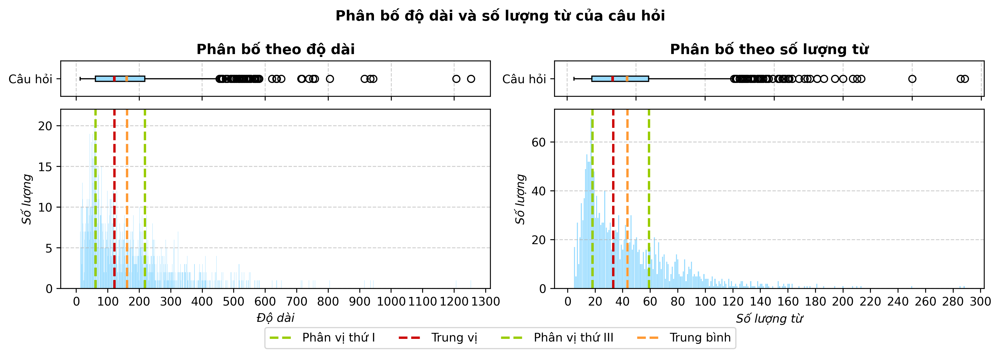

In [72]:
fig, axs = plt.subplots(5, 2, figsize=(12, 4), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của câu hỏi", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()

eda_train["QuestionLength"] = eda_train.QuestionText.apply(len)
axbl.bar(eda_train["QuestionLength"].value_counts().index, eda_train["QuestionLength"].value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(eda_train["QuestionLength"], [25, 50, 75])
mean_line = eda_train["QuestionLength"].mean()
print(q1, q2, mean_line, q3)
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 100
axbl.set_xticks(np.arange(0, max(eda_train["QuestionLength"]) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

axs[0, 0].boxplot(eda_train["QuestionLength"], vert=False, patch_artist=True, tick_labels=["Câu hỏi"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});

eda_train["QuestionNumWord"] = eda_train.QuestionText.apply(lambda x: len(nltk.word_tokenize(x)))
axbr.bar(eda_train["QuestionNumWord"].value_counts().index, eda_train["QuestionNumWord"].value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(eda_train["QuestionNumWord"], [25, 50, 75])
mean_line = eda_train["QuestionNumWord"].mean()
print(q1, q2, mean_line, q3)
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 20
axbr.set_xticks(np.arange(0, max(eda_train["QuestionNumWord"]) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 1].boxplot(eda_train["QuestionNumWord"], vert=False, patch_artist=True, tick_labels=["Câu hỏi"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_raw_question.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Phân bố độ dài:
    - Độ dài của câu hỏi chủ yếu tập trung trong khoảng từ $61$ đến $218$ ký tự, với trung vị $121$;
    - Vẫn có một số câu hỏi có độ dài xuất hiện ở các giá trị lớn hơn $450$ ký tự, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
    - Giá trị trung bình cao hơn trung vị, cho thấy dữ liệu bị lệch dương, cộng thêm phân bố dữ liệu bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

- Phân bố số lượng từ: Nhóm sử dụng hàm $\texttt{word\_tokenize}$ của thư viện $\texttt{nltk}$ để đếm số lượng từ trong câu hỏi:
    - Số lượng từ câu hỏi tập trung nhiều ở khoảng từ $18$ đến $59$, với với trung vị $33$;
    - Vẫn có một số câu hỏi có số lượng từ xuất hiện ở các giá trị lớn hơn $130$, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
    - Giá trị trung bình cao hơn trung vị, cho thấy dữ liệu bị lệch dương, cộng thêm phân bố dữ liệu bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

- **Quan sát độ phức tạp của `QuestionText`**

Chỉ số **readability** (độ dễ đọc) giúp đánh giá mức độ khó hay dễ hiểu của một đoạn văn bản, thường dựa vào cấu trúc câu, số từ, độ dài từ, và các yếu tố ngôn ngữ khác. Các công cụ như **Textstat**, **Flesch-Kincaid**, hay các chỉ số tương tự được sử dụng để tính toán.

**Flesch Reading Ease Score**
Chỉ số này nằm trong khoảng từ 0 đến 100, trong đó:
- **100 - 90**: **Rất dễ đọc** – Thích hợp cho trẻ em lớp 5.
- **90 - 80**: **Dễ đọc** – Thích hợp cho học sinh lớp 6-8.
- **80 - 70**: **Khá dễ đọc** – Thích hợp cho học sinh lớp 9-10.
- **70 - 60**: **Đọc vừa phải** – Thích hợp cho học sinh trung học.
- **60 - 50**: **Hơi khó đọc** – Thích hợp cho học sinh đại học.
- **50 - 30**: **Khó đọc** – Đòi hỏi trình độ đại học.
- **30 - 0**: **Rất khó đọc** – Dành cho các văn bản chuyên ngành phức tạp.

Công thức:
$$206.835 - (1.015 \times \text{ASL}) - (84.6 \times \text{ASW})$$
- ASL: Độ dài câu trung bình (Average Sentence Length).
- ASW: Độ dài từ trung bình (Average Syllables per Word).

In [73]:
# # Định nghĩa hàm tính điểm phức tạp
# def compute_complexity(text):
#     # Load BERT model
#     tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
#     model = AutoModel.from_pretrained("bert-base-uncased")
    
#     # Bước 1: Tính embedding
#     inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=512)
#     outputs = model(**inputs)
#     embedding = outputs.last_hidden_state.mean(dim=1).detach()
    
#     # Bước 2: Tính điểm phức tạp (ở đây dùng norm làm ví dụ)
#     complexity_score = torch.norm(embedding).item()
    
#     return complexity_score

# eda_train['ComplexityScoreQuestion'] = eda_train.QuestionText.apply(compute_complexity)

Slope: -0.007781593377521856
Intercept: 90.06145330668957
R-squared: 0.031943588736021496
P-value: 7.008287293139209e-15
Standard error: 0.0009914135588945272


Slope: -0.026209677000029446
Intercept: 89.94816672724691
R-squared: 0.023500774646006743
P-value: 2.693518750700407e-11
Standard error: 0.003910068559840993
['\\( \\left(\\begin{array}{l}2 \\\\ 3\\end{array}\\right)+\\left(\\begin{array}{c}-1 \\\\ 0\\end{array}\\right)= \\)']


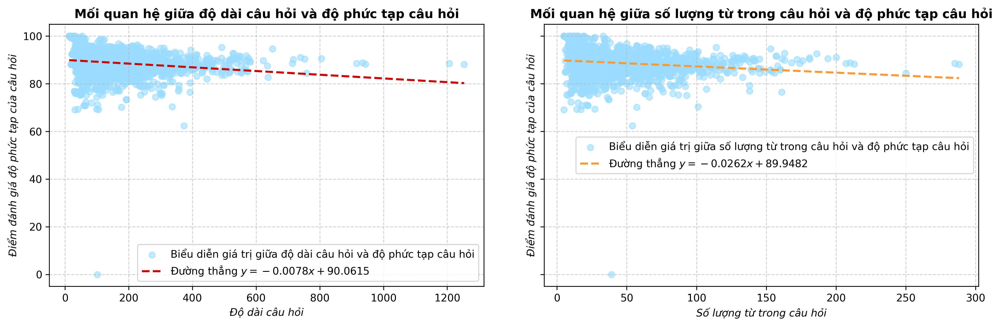

In [74]:
eda_train['ComplexityScoreQuestion'] = eda_train.QuestionText.apply(textstat.flesch_reading_ease)
# Normalize the ComplexityScore from (min, max) to (0, 100)
eda_train['ComplexityScoreQuestion'] = (eda_train['ComplexityScoreQuestion'] - eda_train['ComplexityScoreQuestion'].min()) / (eda_train['ComplexityScoreQuestion'].max() - eda_train['ComplexityScoreQuestion'].min()) * 100

fig, axs = plt.subplots(1, 2, figsize=(13.5, 4.5), dpi=320, sharey=True);

axs[0].scatter(eda_train["QuestionLength"], eda_train['ComplexityScoreQuestion'], alpha=0.6, color=COLOR_LIST[-2]);
axs[0].set_title("Mối quan hệ giữa độ dài câu hỏi và độ phức tạp câu hỏi", weight="bold");
axs[0].set_xlabel("Độ dài câu hỏi", fontdict={'style':'italic'});
axs[0].set_ylabel("Điểm đánh giá độ phức tạp của câu hỏi", fontdict={'style':'italic'});
axs[0].grid(linestyle="--", alpha=0.6);
# Plot linear line for predicting the number of constructs based on the number of subjects
slope, intercept, r_value, p_value, std_err = stats.linregress(eda_train["QuestionLength"], eda_train['ComplexityScoreQuestion'])
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
axs[0].plot(eda_train["QuestionLength"].sort_values(), slope * eda_train["QuestionLength"].sort_values() + intercept, color=DARK_COLOR_LIST[0], linestyle="--", linewidth=2);
axs[0].legend(["Biểu diễn giá trị giữa độ dài câu hỏi và độ phức tạp câu hỏi", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);
print("\n")

axs[1].scatter(eda_train["QuestionNumWord"], eda_train['ComplexityScoreQuestion'], alpha=0.6, color=COLOR_LIST[-2]);
axs[1].set_title("Mối quan hệ giữa số lượng từ trong câu hỏi và độ phức tạp câu hỏi", weight="bold");
axs[1].set_xlabel("Số lượng từ trong câu hỏi", fontdict={'style':'italic'});
axs[1].set_ylabel("Điểm đánh giá độ phức tạp của câu hỏi", fontdict={'style':'italic'});
axs[1].grid(linestyle="--", alpha=0.6);
# Plot linear line for predicting the number of constructs based on the number of subjects
slope, intercept, r_value, p_value, std_err = stats.linregress(eda_train["QuestionNumWord"], eda_train['ComplexityScoreQuestion'])
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
axs[1].plot(eda_train["QuestionNumWord"].sort_values(), slope * eda_train["QuestionNumWord"].sort_values() + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axs[1].legend(["Biểu diễn giá trị giữa số lượng từ trong câu hỏi và độ phức tạp câu hỏi", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);
print(eda_train[eda_train['ComplexityScoreQuestion'] < 20]['QuestionText'].sample().values)

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "complexity_raw_question_with_length.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_  Kết quả trực quan cho thấy độ dài và số lượng từ của một câu hỏi cũng có thể nói lên được câu hỏi có phức tạp hay không, tuy nhiên kết quả kiểm định mức độ phù hợp khá thấp, có nghĩa rằng người trả lời nên đọc nội dung câu hỏi để đánh giá mức độ phức tạp của câu hỏi so với thang đo của bản thân.

- **Quan sát những từ phổ biến trong `QuestionText`**

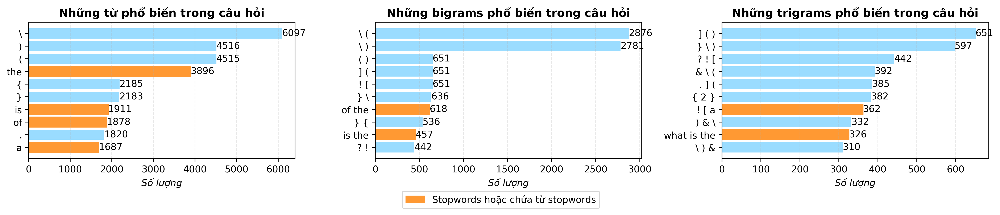

In [75]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(eda_train.QuestionText.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong câu hỏi", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');
for index, word in enumerate(top_words.Word):
    if word in stopwords:
        axs[0].get_children()[index].set_color(DARK_COLOR_LIST[1])
fig.legend(["Stopwords hoặc chứa từ stopwords"], loc="lower center", bbox_to_anchor=(0.5, -0.075), ncol=2);

axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong câu hỏi", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
for index, bigram in enumerate(bigram_count):
    if bigram[0][0] in stopwords or bigram[0][1] in stopwords:
        axs[1].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong câu hỏi", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
for index, trigram in enumerate(trigram_count):
    if trigram[0][0] in stopwords or trigram[0][1] in stopwords or trigram[0][2] in stopwords:
        axs[2].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_raw_question.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_ Đa số các từ và $\texttt{n-grams}$ phổ biến của câu hỏi chưa qua xử lý nội dung văn bản là các cú pháp $\LaTeX$, các từ không cung cấp nhiều ý nghĩa $\texttt{stopwords}$.

##### Quan sát sự thay đổi sau khi tiền xử lý dữ liệu

In [76]:
# Set hyperparameters for `cleanText` function
function_parameters = {
    "stopwords": stopwords,
    "remove_stopwords": [word for word in stopwords if len(word)==1]
}

# Clean the text data in `QuestionText` column
eda_train["QuestionText"] = eda_train.QuestionText.apply(
    lambda text: preprocess_text_question_misconception(text, **function_parameters)
)

39.0 78.0 105.11289459604066 143.0
8.0 17.0 21.925093632958802 30.0


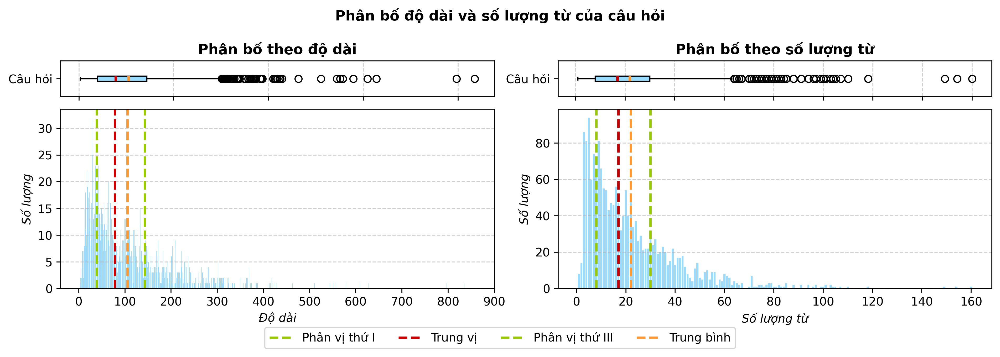

In [77]:
fig, axs = plt.subplots(5, 2, figsize=(12, 4), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của câu hỏi", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()

eda_train["QuestionLength"] = eda_train.QuestionText.apply(len)
axbl.bar(eda_train["QuestionLength"].value_counts().index, eda_train["QuestionLength"].value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(eda_train["QuestionLength"], [25, 50, 75])
mean_line = eda_train["QuestionLength"].mean()
print(q1, q2, mean_line, q3)
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 100
axbl.set_xticks(np.arange(0, max(eda_train["QuestionLength"]) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

axs[0, 0].boxplot(eda_train["QuestionLength"], vert=False, patch_artist=True, tick_labels=["Câu hỏi"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});

eda_train["QuestionNumWord"] = eda_train.QuestionText.apply(lambda x: len(nltk.word_tokenize(x)))
axbr.bar(eda_train["QuestionNumWord"].value_counts().index, eda_train["QuestionNumWord"].value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(eda_train["QuestionNumWord"], [25, 50, 75])
mean_line = eda_train["QuestionNumWord"].mean()
print(q1, q2, mean_line, q3)
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 20
axbr.set_xticks(np.arange(0, max(eda_train["QuestionNumWord"]) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 1].boxplot(eda_train["QuestionNumWord"], vert=False, patch_artist=True, tick_labels=["Câu hỏi"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_preprocessed_question.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

Slope: -0.0757293629177099
Intercept: 79.25136002192089
R-squared: 0.246452089931323
P-value: 7.124144795645474e-117
Standard error: 0.0030646531304714284


Slope: -0.3042300466011511
Intercept: 77.96149973741599
R-squared: 0.17824667474796063
P-value: 1.1243374284414834e-81
Standard error: 0.015117847555487876
['quadrilateral regular polygon']


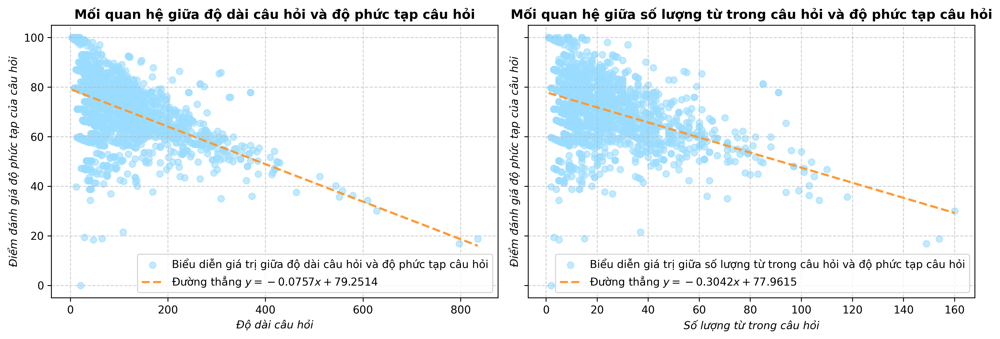

In [78]:
eda_train['ComplexityScoreQuestion'] = eda_train.QuestionText.apply(textstat.flesch_reading_ease)
# Normalize the ComplexityScore from (min, max) to (0, 100)
eda_train['ComplexityScoreQuestion'] = (eda_train['ComplexityScoreQuestion'] - eda_train['ComplexityScoreQuestion'].min()) / (eda_train['ComplexityScoreQuestion'].max() - eda_train['ComplexityScoreQuestion'].min()) * 100

fig, axs = plt.subplots(1, 2, figsize=(13.5, 4.5), dpi=320, sharey=True);

axs[0].scatter(eda_train["QuestionLength"], eda_train['ComplexityScoreQuestion'], alpha=0.6, color=COLOR_LIST[-2]);
axs[0].set_title("Mối quan hệ giữa độ dài câu hỏi và độ phức tạp câu hỏi", weight="bold");
axs[0].set_xlabel("Độ dài câu hỏi", fontdict={'style':'italic'});
axs[0].set_ylabel("Điểm đánh giá độ phức tạp của câu hỏi", fontdict={'style':'italic'});
axs[0].grid(linestyle="--", alpha=0.6);
# Plot linear line for predicting the number of constructs based on the number of subjects
slope, intercept, r_value, p_value, std_err = stats.linregress(eda_train["QuestionLength"], eda_train['ComplexityScoreQuestion'])
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
axs[0].plot(eda_train["QuestionLength"].sort_values(), slope * eda_train["QuestionLength"].sort_values() + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axs[0].legend(["Biểu diễn giá trị giữa độ dài câu hỏi và độ phức tạp câu hỏi", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);
print("\n")

axs[1].scatter(eda_train["QuestionNumWord"], eda_train['ComplexityScoreQuestion'], alpha=0.6, color=COLOR_LIST[-2]);
axs[1].set_title("Mối quan hệ giữa số lượng từ trong câu hỏi và độ phức tạp câu hỏi", weight="bold");
axs[1].set_xlabel("Số lượng từ trong câu hỏi", fontdict={'style':'italic'});
axs[1].set_ylabel("Điểm đánh giá độ phức tạp của câu hỏi", fontdict={'style':'italic'});
axs[1].grid(linestyle="--", alpha=0.6);
# Plot linear line for predicting the number of constructs based on the number of subjects
slope, intercept, r_value, p_value, std_err = stats.linregress(eda_train["QuestionNumWord"], eda_train['ComplexityScoreQuestion'])
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
axs[1].plot(eda_train["QuestionNumWord"].sort_values(), slope * eda_train["QuestionNumWord"].sort_values() + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axs[1].legend(["Biểu diễn giá trị giữa số lượng từ trong câu hỏi và độ phức tạp câu hỏi", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);
print(eda_train[eda_train['ComplexityScoreQuestion'] < 20]['QuestionText'].sample().values)

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "complexity_preprocessed_question_with_length.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

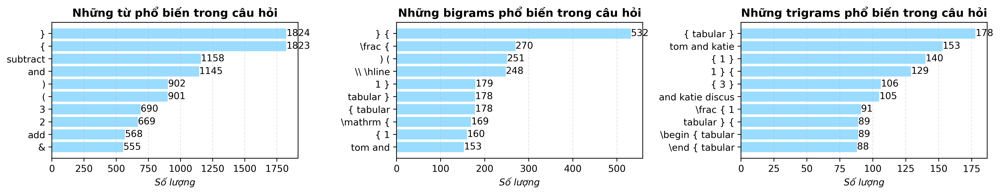

In [79]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(eda_train.QuestionText))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong câu hỏi", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');

axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong câu hỏi", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong câu hỏi", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_preprocessed_question.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Phân bố độ dài:

    - Sau khi tiền xử lý, phân bố độ dài của câu hỏi trở nên gọn gàng hơn, với trung vị giảm từ $121$ ký tự xuống còn khoảng $78$ ký tự.
    - Phạm vi độ dài tập trung chủ yếu trong khoảng $39$ đến $143$ ký tự, loại bỏ được nhiều giá trị ngoại lệ vượt quá $450$ ký tự. Điều này giúp giảm độ phức tạp trong xử lý ngôn ngữ tự nhiên, tăng tốc độ huấn luyện và giảm nguy cơ gây nhiễu cho mô hình.


- Phân bố số lượng từ:

    - Số lượng từ trong câu hỏi sau tiền xử lý giảm đáng kể, với trung vị giảm từ $33$ xuống còn khoảng $17$ từ, và phân bố chủ yếu trong khoảng $8$ đến $30$ từ. Điều này chứng minh rằng việc loại bỏ stopwords và các cú pháp đặc biệt đã giúp câu hỏi trở nên rõ ràng và tập trung vào nội dung chính.
    - Phân bố số lượng từ trở nên đồng nhất hơn, giảm thiểu đuôi phải dày và làm dữ liệu dễ dàng được xử lý bởi các mô hình học sâu. Sự chuẩn hóa này giúp mô hình tập trung vào các từ khóa quan trọng, nâng cao hiệu quả trong việc học các đặc trưng ngữ nghĩa.


- Điểm đánh giá mức độ phức tạp:

    - Sau tiền xử lý, điểm $\texttt{Flesch Reading Ease Score}$ cho thấy mức sự ảnh hưởng của kích thước câu hỏi ảnh hưởng đến độ phức tạp của nội dung rõ rệt. Điều này cho thấy các câu hỏi đã trở nên đơn giản và dễ hiểu hơn, giúp mô hình xử lý ngôn ngữ tự nhiên dễ dàng nắm bắt ý nghĩa mà không bị nhiễu bởi cú pháp phức tạp.
    - Độ phức tạp giảm còn mang lại lợi ích trong việc cải thiện độ chính xác của các mô hình dự đoán nhờ loại bỏ được các yếu tố gây khó khăn không cần thiết trong văn bản.


- Những từ và $\texttt{n-grams}$ phổ biến:

    - Sau khi tiền xử lý, các từ và $\texttt{n-grams}$ phổ biến trở nên rõ ràng hơn, với sự xuất hiện chủ yếu của các từ khóa liên quan đến nội dung cốt lõi của câu hỏi. Các $\texttt{stopwords}$ và cú pháp đặc biệt không cần thiết đã được loại bỏ, giúp mô hình tập trung vào các đặc trưng quan trọng.
    - Việc chuẩn hóa và loại bỏ nhiễu trong văn bản dẫn đến sự đồng nhất cao hơn giữa các mẫu, cải thiện khả năng học của mô hình Deep Learning, đặc biệt là trong việc khai thác mối quan hệ ngữ nghĩa giữa các từ và cụm từ.
    - $\texttt{N-grams}$ sau tiền xử lý cũng thể hiện sự tập trung vào các cụm từ quan trọng, phản ánh ngữ cảnh và nội dung đặc trưng của bộ dữ liệu. Điều này mang lại lợi ích lớn cho các mô hình dự đoán dựa trên ngữ cảnh.

#### `Answer[A/B/C/D]Text`

In [80]:
# Merge `train_text` ["AnswerAText", "AnswerBText", "AnswerCText", "AnswerDText"] to a Series `answer_text`
answer_text = eda_train["AnswerAText"].copy()
answer_text = pd.concat([answer_text, eda_train["AnswerBText"]], axis=0)
answer_text = pd.concat([answer_text, eda_train["AnswerCText"]], axis=0)
answer_text = pd.concat([answer_text, eda_train["AnswerDText"]], axis=0)
answer_text = answer_text.reset_index(drop=True)
answer_text = pd.DataFrame(answer_text, columns=["AnswerText"])
answer_text.AnswerText = answer_text.AnswerText.apply(lambda text: str.lower(text))

In [81]:
answer_text.sample(5)

,AnswerText
94,only tom
2550,only katie
5034,\( 100 \)
5795,neither is correct
3910,\( -7 \)


##### Quan sát với dữ liệu gốc

- **Thống kê về độ dài câu trả lời:**

8.0 12.0 21.772204387372927 19.0
5.0 5.0 8.214419475655431 9.0


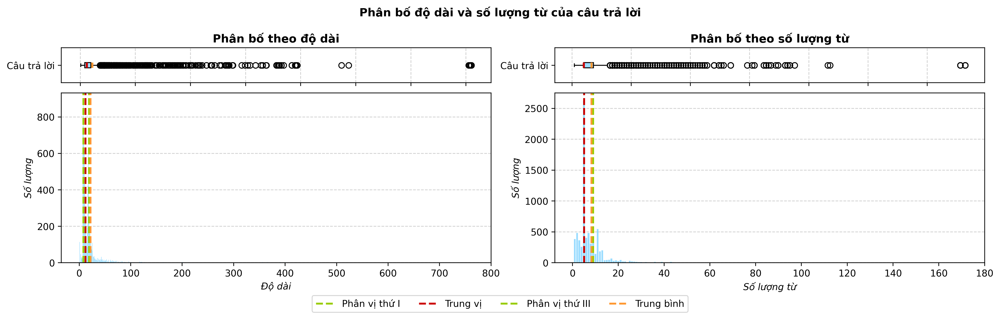

In [82]:
fig, axs = plt.subplots(5, 2, figsize=(15, 4.5), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của câu trả lời", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()
    
answer_text["AnswerLength"] = answer_text.AnswerText.apply(len)
axbl.bar(answer_text["AnswerLength"].value_counts().index, answer_text["AnswerLength"].value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(answer_text["AnswerLength"], [25, 50, 75])
mean_line = answer_text["AnswerLength"].mean()
print(q1, q2, mean_line, q3)
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 100
axbl.set_xticks(np.arange(0, max(answer_text["AnswerLength"]) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 0].boxplot(answer_text["AnswerLength"], vert=False, patch_artist=True, tick_labels=["Câu trả lời"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

answer_text["AnswerNumWord"] = answer_text.AnswerText.apply(lambda x: len(nltk.word_tokenize(x)))
axbr.bar(answer_text["AnswerNumWord"].value_counts().index, answer_text["AnswerNumWord"].value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(answer_text["AnswerNumWord"], [25, 50, 75])
mean_line = answer_text["AnswerNumWord"].mean()
print(q1, q2, mean_line, q3)
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 20
axbr.set_xticks(np.arange(0, max(answer_text["AnswerNumWord"]) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 1].boxplot(answer_text["AnswerNumWord"], vert=False, patch_artist=True, tick_labels=["Câu trả lời"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_raw_answer.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Phân bố độ dài:
    - Độ dài của câu trả lời chủ yếu tập trung trong khoảng từ $8$ đến $19$ ký tự, với trung vị $12$;
    - Số lượng câu trả lời có độ dài xuất hiện ở các giá trị lớn hơn $50$ ký tự, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
    - Giá trị trung bình cao hơn tứ phân vị thứ III, cho thấy dữ liệu bị lệch dương rất nhiều, cộng thêm phân bố dữ liệu bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

- Phân bố số lượng từ: Nhóm sử dụng hàm $\texttt{word\_tokenize}$ của thư viện $\texttt{nltk}$ để đếm số lượng từ trong câu hỏi:
    - Số lượng từ câu hỏi tập trung nhiều ở khoảng từ $5$ đến $9$, với với trung vị $5$;
    - Vẫn có một số câu hỏi có số lượng từ xuất hiện ở các giá trị lớn hơn $20$, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
    - Giá trị trung bình bám sát tứ phân vị thứ III, cho thấy dữ liệu bị lệch dương, cộng thêm phân bố dữ liệu bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

- **Quan sát độ phức tạp của nội dung phương án trả lời**

Slope: -0.041942741802477555
Intercept: 82.11798001338612
R-squared: 0.045230491346639534
P-value: 3.2889960404424463e-77
Standard error: 0.0022290196030952127


Slope: -0.1359732686075183
Intercept: 82.32173553211389
R-squared: 0.028309110913967022
P-value: 1.3484614479597845e-48
Standard error: 0.009214630841180502
['parallelogram']


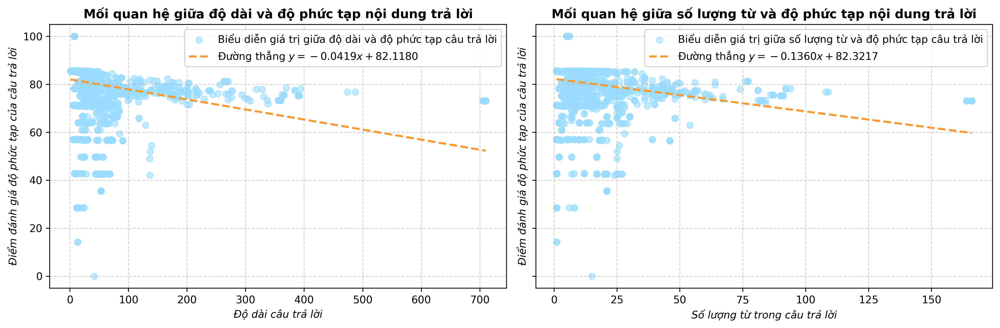

In [83]:
answer_text['ComplexityScore'] = answer_text.AnswerText.apply(textstat.flesch_reading_ease)
# Normalize the ComplexityScore from (min, max) to (0, 100)
answer_text['ComplexityScore'] = (answer_text['ComplexityScore'] - answer_text['ComplexityScore'].min()) / (answer_text['ComplexityScore'].max() - answer_text['ComplexityScore'].min()) * 100

fig, axs = plt.subplots(1, 2, figsize=(13.5, 4.5), dpi=320, sharey=True);

axs[0].scatter(answer_text["AnswerLength"], answer_text['ComplexityScore'], alpha=0.6, color=COLOR_LIST[-2]);
axs[0].set_title("Mối quan hệ giữa độ dài và độ phức tạp nội dung trả lời", weight="bold");
axs[0].set_xlabel("Độ dài câu trả lời", fontdict={'style':'italic'});
axs[0].set_ylabel("Điểm đánh giá độ phức tạp của câu trả lời", fontdict={'style':'italic'});
axs[0].grid(linestyle="--", alpha=0.6);
slope, intercept, r_value, p_value, std_err = stats.linregress(answer_text["AnswerLength"], answer_text['ComplexityScore'])
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
axs[0].plot(answer_text["AnswerLength"].sort_values(), slope * answer_text["AnswerLength"].sort_values() + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axs[0].legend(["Biểu diễn giá trị giữa độ dài và độ phức tạp câu trả lời", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);
print("\n")

axs[1].scatter(answer_text["AnswerNumWord"], answer_text['ComplexityScore'], alpha=0.6, color=COLOR_LIST[-2]);
axs[1].set_title("Mối quan hệ giữa số lượng từ và độ phức tạp nội dung trả lời", weight="bold");
axs[1].set_xlabel("Số lượng từ trong câu trả lời", fontdict={'style':'italic'});
axs[1].set_ylabel("Điểm đánh giá độ phức tạp của câu trả lời", fontdict={'style':'italic'});
axs[1].grid(linestyle="--", alpha=0.6);
slope, intercept, r_value, p_value, std_err = stats.linregress(answer_text["AnswerNumWord"], answer_text['ComplexityScore'])
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
axs[1].plot(answer_text["AnswerNumWord"].sort_values(), slope * answer_text["AnswerNumWord"].sort_values() + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axs[1].legend(["Biểu diễn giá trị giữa số lượng từ và độ phức tạp câu trả lời", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);
print(answer_text[answer_text['ComplexityScore'] < 30]['AnswerText'].sample().values)

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "complexity_raw_answer_with_length.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_ Kết quả trực quan cho thấy nội dung câu trả lời cần phải có sự tư duy để hiểu, đồng thời độ dài và số lượng từ của câu trả lời cũng có thể nói lên phần nào nội dung có phức tạp hay không, tuy nhiên kết quả kiểm định mức độ phù hợp khá thấp.

- **Quan sát những từ phổ biến**

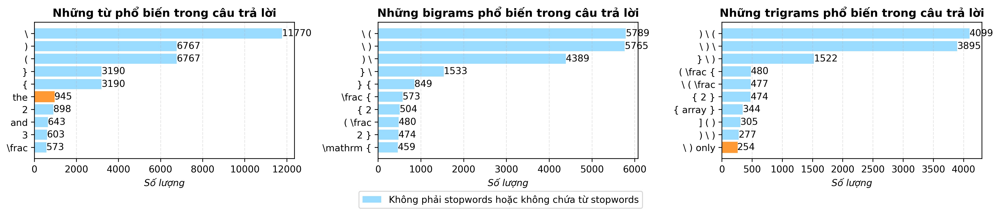

In [84]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(answer_text.AnswerText.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong câu trả lời", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');
for index, word in enumerate(top_words.Word):
    if word in stopwords:
        axs[0].get_children()[index].set_color(DARK_COLOR_LIST[1])
fig.legend(["Không phải stopwords hoặc không chứa từ stopwords"], loc="lower center", bbox_to_anchor=(0.5, -0.075), ncol=2);

axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong câu trả lời", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
for index, bigram in enumerate(bigram_count):
    if bigram[0][0] in stopwords or bigram[0][1] in stopwords:
        axs[1].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong câu trả lời", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
for index, trigram in enumerate(trigram_count):
    if trigram[0][0] in stopwords or trigram[0][1] in stopwords or trigram[0][2] in stopwords:
        axs[2].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_raw_answer.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_ Đa số các từ và $\texttt{n-grams}$ phổ biến của câu hỏi chưa qua xử lý nội dung văn bản là các cú pháp $\LaTeX$.

##### Quan sát sự thay đổi sau khi tiền xử lý dữ liệu

In [85]:
function_parameters = {
    "stopwords": stopwords,
    "remove_stopwords": [word for word in stopwords if len(word)==1]
}

# Clean the text data in `QuestionText` column
answer_text.AnswerText = answer_text.AnswerText.apply(
    lambda text: preprocess_text_question_misconception(text, **function_parameters)
)

3.0 9.0 15.030096308186195 15.0
1.0 2.0 4.097110754414126 5.0


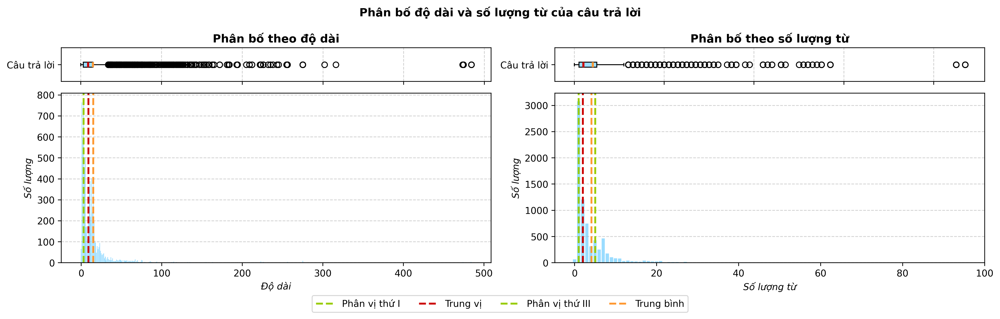

In [86]:
fig, axs = plt.subplots(5, 2, figsize=(15, 4.5), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của câu trả lời", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()
    
answer_text["AnswerLength"] = answer_text.AnswerText.apply(len)
axbl.bar(answer_text["AnswerLength"].value_counts().index, answer_text["AnswerLength"].value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(answer_text["AnswerLength"], [25, 50, 75])
mean_line = answer_text["AnswerLength"].mean()
print(q1, q2, mean_line, q3)
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 100
axbl.set_xticks(np.arange(0, max(answer_text["AnswerLength"]) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 0].boxplot(answer_text["AnswerLength"], vert=False, patch_artist=True, tick_labels=["Câu trả lời"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

answer_text["AnswerNumWord"] = answer_text.AnswerText.apply(lambda x: len(nltk.word_tokenize(x)))
axbr.bar(answer_text["AnswerNumWord"].value_counts().index, answer_text["AnswerNumWord"].value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(answer_text["AnswerNumWord"], [25, 50, 75])
mean_line = answer_text["AnswerNumWord"].mean()
print(q1, q2, mean_line, q3)
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 20
axbr.set_xticks(np.arange(0, max(answer_text["AnswerNumWord"]) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

axs[0, 1].boxplot(answer_text["AnswerNumWord"], vert=False, patch_artist=True, tick_labels=["Câu trả lời"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_preprocessed_answer.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

Slope: -0.10747077309916639
Intercept: 79.62620735596707
R-squared: 0.11749669630887122
P-value: 3.729606399570108e-205
Standard error: 0.0034068982909805476


Slope: -0.46052877229912353
Intercept: 79.89774867167525
R-squared: 0.09647598258005358
P-value: 6.5926695776111516e-167
Standard error: 0.01630198418184772
['perpendicular']


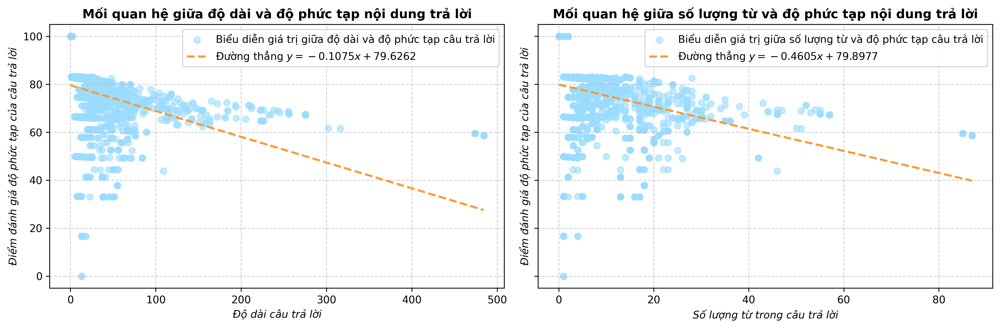

In [87]:
answer_text['ComplexityScore'] = answer_text.AnswerText.apply(textstat.flesch_reading_ease)
# Normalize the ComplexityScore from (min, max) to (0, 100)
answer_text['ComplexityScore'] = (answer_text['ComplexityScore'] - answer_text['ComplexityScore'].min()) / (answer_text['ComplexityScore'].max() - answer_text['ComplexityScore'].min()) * 100

fig, axs = plt.subplots(1, 2, figsize=(13.5, 4.5), dpi=320, sharey=True);

axs[0].scatter(answer_text["AnswerLength"], answer_text['ComplexityScore'], alpha=0.6, color=COLOR_LIST[-2]);
axs[0].set_title("Mối quan hệ giữa độ dài và độ phức tạp nội dung trả lời", weight="bold");
axs[0].set_xlabel("Độ dài câu trả lời", fontdict={'style':'italic'});
axs[0].set_ylabel("Điểm đánh giá độ phức tạp của câu trả lời", fontdict={'style':'italic'});
axs[0].grid(linestyle="--", alpha=0.6);
slope, intercept, r_value, p_value, std_err = stats.linregress(answer_text["AnswerLength"], answer_text['ComplexityScore'])
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
axs[0].plot(answer_text["AnswerLength"].sort_values(), slope * answer_text["AnswerLength"].sort_values() + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axs[0].legend(["Biểu diễn giá trị giữa độ dài và độ phức tạp câu trả lời", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);
print("\n")

axs[1].scatter(answer_text["AnswerNumWord"], answer_text['ComplexityScore'], alpha=0.6, color=COLOR_LIST[-2]);
axs[1].set_title("Mối quan hệ giữa số lượng từ và độ phức tạp nội dung trả lời", weight="bold");
axs[1].set_xlabel("Số lượng từ trong câu trả lời", fontdict={'style':'italic'});
axs[1].set_ylabel("Điểm đánh giá độ phức tạp của câu trả lời", fontdict={'style':'italic'});
axs[1].grid(linestyle="--", alpha=0.6);
slope, intercept, r_value, p_value, std_err = stats.linregress(answer_text["AnswerNumWord"], answer_text['ComplexityScore'])
print(f"Slope: {slope}\nIntercept: {intercept}\nR-squared: {r_value**2}\nP-value: {p_value}\nStandard error: {std_err}")
axs[1].plot(answer_text["AnswerNumWord"].sort_values(), slope * answer_text["AnswerNumWord"].sort_values() + intercept, color=DARK_COLOR_LIST[1], linestyle="--", linewidth=2);
axs[1].legend(["Biểu diễn giá trị giữa số lượng từ và độ phức tạp câu trả lời", f"Đường thẳng $y={slope:.4f}x+{intercept:.4f}$"]);
print(answer_text[answer_text['ComplexityScore'] < 30]['AnswerText'].sample().values)

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "complexity_preprocessed_answer_with_length.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

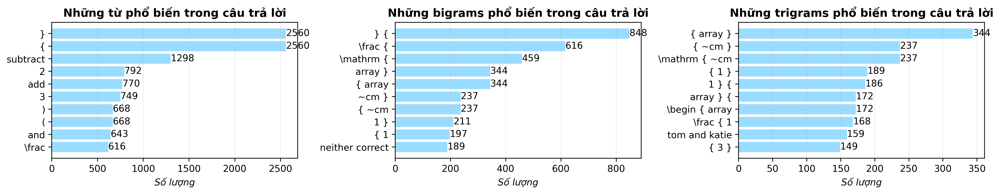

In [88]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(answer_text.AnswerText.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong câu trả lời", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');

axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong câu trả lời", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong câu trả lời", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_preprocessed_answer.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Phân bố độ dài và số lượng từ: Không có sự thay đổi quá nhiều ở các số liệu trung vị và tứ phân vị, điểm thay đổi có thể thấy rõ rệt là phần đuôi dày bên phải được hạn chế không còn kéo quá dài.

- Điểm đánh giá mức độ phức tạp: Việc tiền xử lý dữ liệu không làm nội dung câu trả lời trở nên dễ hiểu hơn. Bản chất nội dung câu trả lời vẫn đòi hỏi việc tư duy để lựa chọn đáp án đúng.

- Những từ và $\texttt{n-grams}$ phổ biến:
    - Sau khi tiền xử lý, các từ và $\texttt{n-grams}$ phổ biến trở nên rõ ràng hơn, với sự xuất hiện chủ yếu của các từ khóa liên quan đến nội dung cốt lõi của câu trả lời. Các $\texttt{stopwords}$ và cú pháp đặc biệt không cần thiết đã được loại bỏ, giúp mô hình tập trung vào các đặc trưng quan trọng.
    - Việc chuẩn hóa và loại bỏ nhiễu trong văn bản dẫn đến sự đồng nhất cao hơn giữa các mẫu, cải thiện khả năng học của mô hình Deep Learning, đặc biệt là trong việc khai thác mối quan hệ ngữ nghĩa giữa các từ và cụm từ.
    - $\texttt{N-grams}$ sau tiền xử lý cũng thể hiện sự tập trung vào các cụm từ quan trọng, phản ánh ngữ cảnh và nội dung đặc trưng của bộ dữ liệu. Điều này mang lại lợi ích lớn cho các mô hình dự đoán dựa trên ngữ cảnh.

## **_Tập dữ liệu `misconception_mapping.csv`_**

### _Thống kê tổng quát các đặc trưng_

In [89]:
# Describe the train data for categorical columns
category_columns = misconception_df.select_dtypes(include=['object']).columns
misconception_df[category_columns].describe()

,MisconceptionName
count,2587
unique,2587
top,Misunderstands order of operations in algebrai...
freq,1


In [90]:
# Describe the train data for numerical columns
numeric_columns = misconception_df.select_dtypes(include=['int64', 'float64']).columns
misconception_df[numeric_columns].describe()

,MisconceptionId
count,2587.000000
mean,1293.000000
std,746.946897
min,0.000000
25%,646.500000
50%,1293.000000
75%,1939.500000
max,2586.000000


In [91]:
misconception_df["MisconceptionName"].sample()

689    When multiplying algebraic terms written in th...
Name: MisconceptionName, dtype: object

### _Khám phá nội dung misconception_

In [92]:
eda_mcp = misconception_df.copy()
eda_mcp.MisconceptionName = eda_mcp.MisconceptionName.apply(lambda text: str.lower(text))

#### Quan sát dữ liệu gốc

_Thống kê độ dài_

49.0 66.0 70.42133745651334 86.0
8.0 11.0 12.530344027831465 16.0


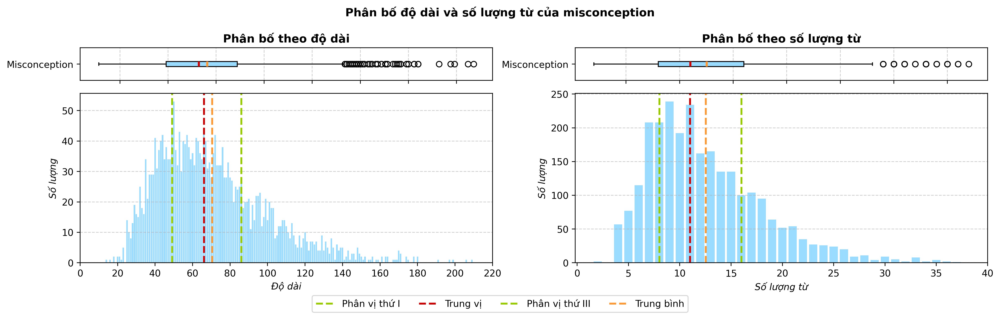

In [93]:
fig, axs = plt.subplots(5, 2, figsize=(15, 4.5), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của misconception", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()
    
misconception_length = eda_mcp.MisconceptionName.apply(len)
axs[0, 0].boxplot(misconception_length, vert=False, patch_artist=True, tick_labels=["Misconception"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);

axbl.bar(misconception_length.value_counts().index, misconception_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(misconception_length, [25, 50, 75])
mean_line = misconception_length.mean()
print(q1, q2, mean_line, q3)
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 20
axbl.set_xticks(np.arange(0, max(misconception_length) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

misconception_num_word = eda_mcp.MisconceptionName.apply(lambda x: len(nltk.word_tokenize(x)))
axs[0, 1].boxplot(misconception_num_word, vert=False, patch_artist=True, tick_labels=["Misconception"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);

axbr.bar(misconception_num_word.value_counts().index, misconception_num_word.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(misconception_num_word, [25, 50, 75])
mean_line = misconception_num_word.mean()
print(q1, q2, mean_line, q3)
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 5
axbr.set_xticks(np.arange(0, max(misconception_num_word) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_raw_misconception.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Độ dài của $\texttt{misconception}$ chủ yếu tập trung trong khoảng từ $49$ đến $86$ ký tự, với trung vị $66$;
- Vẫn có một số $\texttt{misconception}$ có độ dài xuất hiện ở các giá trị lớn hơn $140$ ký tự, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
- Giá trị trung bình cao hơn trung vị, cho thấy dữ liệu bị lệch dương, cộng thêm phân bố dữ liệu bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

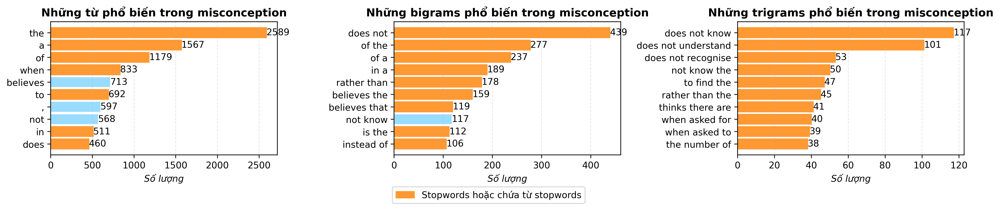

In [94]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(eda_mcp.MisconceptionName.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong misconception", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');
for index, word in enumerate(top_words.Word):
    if word in stopwords:
        axs[0].get_children()[index].set_color(DARK_COLOR_LIST[1])
fig.legend(["Stopwords hoặc chứa từ stopwords"], loc="lower center", bbox_to_anchor=(0.5, -0.075), ncol=2);
        
axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong misconception", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
for index, bigram in enumerate(bigram_count):
    if bigram[0][0] in stopwords or bigram[0][1] in stopwords:
        axs[1].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong misconception", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
for index, trigram in enumerate(trigram_count):
    if trigram[0][0] in stopwords or trigram[0][1] in stopwords or trigram[0][2] in stopwords:
        axs[2].get_children()[index].set_color(DARK_COLOR_LIST[1])
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_raw_misconception.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Số lượng từ $\texttt{misconception}$ tập trung nhiều ở khoảng từ $8$ đến $16$, với với trung vị $11$;
- Vẫn có một số $\texttt{misconception}$ có số lượng từ xuất hiện ở các giá trị lớn hơn $30$, như được minh họa qua các điểm ngoài trong biểu đồ $\texttt{boxplot}$;
- Giá trị trung bình cao hơn trung vị, cho thấy dữ liệu bị lệch dương, cộng thêm phân bố dữ liệu bị kéo dài ở phần đuôi phải, làm cho đồ thị có phần đuôi phải dày.

#### Quan sát sự thay đổi sau khi tiền xử lý dữ liệu

In [95]:
# processed_misconception = misconception_df.copy()
# processed_misconception["MisconceptionName"] = processed_misconception["MisconceptionName"].apply(preprocess_text_subject_construct)

# function_parameters = {
#     "stopwords": stopwords,
#     "remove_stopwords": [word for word in stopwords if len(word)==1]
# }

# Clean the text data in `QuestionText` column
eda_mcp["MisconceptionName"] = eda_mcp["MisconceptionName"].apply(
    lambda text: preprocess_text_subject_construct(text)
)

In [96]:
eda_mcp.sample(5)

,MisconceptionId,MisconceptionName
141,141,complete square form confuse x and coordinate ...
1175,1175,use base instead height h area trapezium formula
2502,2502,believe reciprocal equation quadratic graph
183,183,confuse cube number prime number
2191,2191,write number percentage another number get wro...


34.0 45.0 47.98763045999227 59.0
5.0 7.0 7.135291843834557 8.0


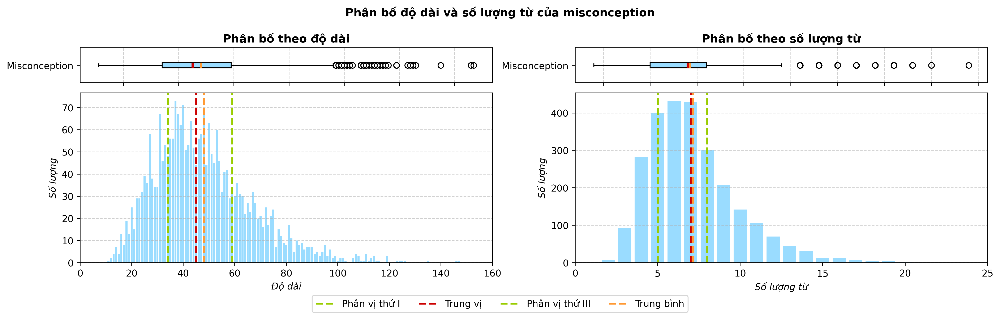

In [97]:
fig, axs = plt.subplots(5, 2, figsize=(15, 4.5), dpi=320, sharex='col');

fig.suptitle("Phân bố độ dài và số lượng từ của misconception", weight="bold");

axbl = fig.add_subplot(axs[1, 0].get_gridspec()[1:, 0])
for ax in axs[1:, 0]:
    ax.remove()
axbr = fig.add_subplot(axs[1, 1].get_gridspec()[1:, 1])
for ax in axs[1:, 1]:
    ax.remove()
    
misconception_length = eda_mcp.MisconceptionName.apply(len)
axs[0, 0].boxplot(misconception_length, vert=False, patch_artist=True, tick_labels=["Misconception"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 0].set_title("Phân bố theo độ dài", fontdict={"weight": "bold"});
axs[0, 0].grid(axis="x", linestyle="--", alpha=0.6);

axbl.bar(misconception_length.value_counts().index, misconception_length.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(misconception_length, [25, 50, 75])
mean_line = misconception_length.mean()
print(q1, q2, mean_line, q3)
axbl.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbl.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbl.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbl.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 20
axbl.set_xticks(np.arange(0, max(misconception_length) + modify_ticks, modify_ticks));
axbl.set_xlabel("Độ dài", fontdict={'style':'italic'});
axbl.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbl.grid(axis="y", linestyle="--", alpha=0.6);
fig.legend(loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=4);

misconception_num_word = eda_mcp.MisconceptionName.apply(lambda x: len(nltk.word_tokenize(x)))
axs[0, 1].boxplot(misconception_num_word, vert=False, patch_artist=True, tick_labels=["Misconception"],
                    boxprops=dict(facecolor=COLOR_LIST[-2], color="black"), showmeans=True, meanline=True,
                    whiskerprops=dict(color="black"), capprops=dict(color="black"),
                    medianprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[0]),
                    meanprops=dict(linestyle='solid', linewidth=2.25, color=DARK_COLOR_LIST[1]));
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);
axs[0, 1].set_title("Phân bố theo số lượng từ", fontdict={"weight": "bold"});
axs[0, 1].grid(axis="x", linestyle="--", alpha=0.6);

axbr.bar(misconception_num_word.value_counts().index, misconception_num_word.value_counts().values, color=COLOR_LIST[-2]);
q1, q2, q3 = np.percentile(misconception_num_word, [25, 50, 75])
mean_line = misconception_num_word.mean()
print(q1, q2, mean_line, q3)
axbr.axvline(q1, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ I");
axbr.axvline(q2, color=DARK_COLOR_LIST[0], linestyle='--', linewidth=2, label="Trung vị");
axbr.axvline(q3, color=DARK_COLOR_LIST[2], linestyle='--', linewidth=2, label="Phân vị thứ III");
axbr.axvline(mean_line, color=DARK_COLOR_LIST[1], linestyle='--', linewidth=2, label="Trung bình");
modify_ticks = 5
axbr.set_xticks(np.arange(0, max(misconception_num_word) + modify_ticks, modify_ticks));
axbr.set_xlabel("Số lượng từ", fontdict={'style':'italic'});
axbr.set_ylabel("Số lượng", fontdict={'style':'italic'});
axbr.grid(axis="y", linestyle="--", alpha=0.6);

fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "length_preprocessed_misconception.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

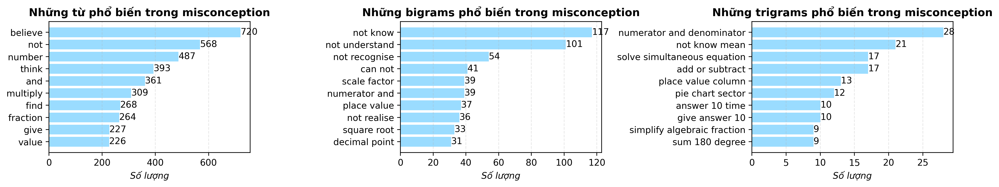

In [98]:
N_TOP = 10

tokens = nltk.word_tokenize(" ".join(eda_mcp.MisconceptionName.apply(str.lower)))
bigrams = ngrams(tokens, 2)
trigrams = ngrams(tokens, 3)

# Count the number of each word
top_words = Counter(tokens).most_common(N_TOP)
# Sort the top words by frequency in descending order
top_words = sorted(top_words, key=lambda x: x[1], reverse=False)
top_words = pd.DataFrame(top_words, columns=["Word", "Count"])

# Count the number of bigrams and trigrams
bigram_count = Counter(bigrams).most_common(N_TOP)
trigram_count = Counter(trigrams).most_common(N_TOP)
# Sort the bigram and trigram count by frequency in descending order
bigram_count = sorted(bigram_count, key=lambda x: x[1], reverse=False)
trigram_count = sorted(trigram_count, key=lambda x: x[1], reverse=False)
# Convert the bigrams and trigrams from tuples to strings
str_bigram_count = [(f"{bigram[0]} {bigram[1]}", count) for bigram, count in bigram_count]
str_trigram_count = [(f"{trigram[0]} {trigram[1]} {trigram[2]}", count) for trigram, count in trigram_count]
str_bigram_count = pd.DataFrame(str_bigram_count, columns=["Bigram", "Count"])
str_trigram_count = pd.DataFrame(str_trigram_count, columns=["Trigram", "Count"])

fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=320);

axs[0].barh(top_words.Word, top_words.Count, color=COLOR_LIST[-2]);
axs[0].set_title("Những từ phổ biến trong misconception", fontdict={"weight": "bold"});
axs[0].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[0].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(top_words.Count):
    axs[0].text(v, i, str(v), color='black', va='center');
        
axs[1].barh(str_bigram_count.Bigram, str_bigram_count.Count, color=COLOR_LIST[-2]);
axs[1].set_title("Những bigrams phổ biến trong misconception", fontdict={"weight": "bold"});
axs[1].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[1].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_bigram_count.Count):
    axs[1].text(v, i, str(v), color='black', va='center');
        
axs[2].barh(str_trigram_count.Trigram, str_trigram_count.Count, color=COLOR_LIST[-2]);
axs[2].set_title("Những trigrams phổ biến trong misconception", fontdict={"weight": "bold"});
axs[2].set_xlabel("Số lượng", fontdict={'style':'italic'});
axs[2].grid(axis='x', linestyle='--', alpha=0.3);
for i, v in enumerate(str_trigram_count.Count):
    axs[2].text(v, i, str(v), color='black', va='center');
        
fig.tight_layout(w_pad=1, h_pad=0.75);

# Save the figure to PATH_FIGURES with .svg format
plt.savefig(PATH_FIGURES + "popular_words_ngrams_preprocessed_misconception.svg", format="svg", bbox_inches='tight', pad_inches=0.1);

_Nhận xét:_
- Phân bố độ dài:
    - Độ dài của các $\texttt{misconception}$ giảm đáng kể, từ trung vị $66$ ký tự xuống còn khoảng $45$ ký tự, tập trung trong $[34,59]$ ký tự. Điều này cho thấy hiệu quả của các bước tiền xử lý trong việc loại bỏ nhiễu và chuẩn hóa văn bản;
    - Sự giảm này giúp đơn giản hóa dữ liệu đầu vào, giảm độ phức tạp tính toán cho mô hình và cải thiện khả năng học tập trên các đặc trưng quan trọng hơn.

- Phân bố số lượng từ:
    - Số lượng từ trong $\texttt{misconception}$ giảm từ trung vị $11$ xuống khoảng $7$, tập trung chủ yếu trong $[5,8]$ từ. Điều này phản ánh việc tinh gọn văn bản, tập trung vào các thông tin cốt lõi và loại bỏ từ ít ý nghĩa;
    - Phân bố số lượng từ sau xử lý cũng thu hẹp khoảng cách giữa giá trị trung bình và trung vị, giảm thiểu đuôi phải dày, giúp mô hình nhận diện đặc trưng ngữ nghĩa dễ dàng hơn, đồng thời tối ưu tài nguyên khi huấn luyện.

- Những từ và $\texttt{n-grams}$ phổ biến:
    - Các từ và $\texttt{n-grams}$ phổ biến trở nên đồng nhất và tập trung hơn vào từ khóa sau khi loại bỏ stopwords và thực hiện $\texttt{lemmatization}$. Điều này làm nổi bật các yếu tố quan trọng trong $\texttt{misconception}$;
    - Việc đồng nhất hóa này không chỉ cải thiện chất lượng đặc trưng mà còn giúp mô hình dễ dàng khai thác các quan hệ ngữ nghĩa, từ đó nâng cao hiệu suất dự đoán.